In [1]:
import mne
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import io
import seaborn as sns

# Author: Martin Luessi <mluessi@nmr.mgh.harvard.edu>
# License: BSD (3-clause)
from matplotlib.colors import TwoSlopeNorm

import os.path as op
from mne.time_frequency import tfr_multitaper
from mne.stats import permutation_cluster_1samp_test as pcluster_test

from mne_connectivity import spectral_connectivity_epochs, seed_target_indices
from mne.datasets import sample
from mne_connectivity.viz import plot_sensors_connectivity
from mne.stats import permutation_cluster_test
from scipy import stats as stats
from functools import partial

print(__doc__)

Automatically created module for IPython interactive environment


In [2]:
dict015= {'FP1':'eeg','FP2':'eeg','AF7':'eeg','AF3':'eeg','AFz':'eeg','AF4':'eeg','AF8':'eeg','F7':'eeg','F3':'eeg',
          'Fz':'eeg','F4':'eeg','F8':'eeg','FT9':'eeg','FC5':'eeg','FC1':'eeg','FC2':'eeg','FC6':'eeg','FT10':'eeg',
          'T7':'eeg','C3':'eeg','Cz':'eeg','C4':'eeg','T8':'eeg','TP9':'eeg','CP5':'eeg','CP1':'eeg', 'CP2':'eeg',
          'CP6':'eeg','TP10':'eeg','P7':'eeg','P3':'eeg','Pz':'eeg','P4':'eeg','P8':'eeg', 'O1':'eeg','O2':'eeg',
          'DBS1-2':'dbs','DBS2-3':'dbs','DBS3-4':'dbs','DBS4-5':'dbs','DBS5-6':'dbs','DBS6-7':'dbs','DBS7-8':'dbs',
          'mean(DBS1-DBS2, DBS2-DBS3, DBS3-DBS4, DBS4-DBS5, DBS5-DBS6, DBS6-DBS7, DBS7-DBS8)':'misc',
          'DynL(lc)':'misc','DynR(lc)':'misc','EmgL':'emg','EmgR':'emg','EmgL(lc)':'emg','EmgR(lc)':'emg'}

dict013_imp = {'FP1':'eeg','FP2':'eeg','AF7':'eeg','AF3':'eeg','AFz':'eeg','AF4':'eeg','AF8':'eeg','F7':'eeg','F3':'eeg',
          'Fz':'eeg','F4':'eeg','F8':'eeg','FC5':'eeg','FC1':'eeg','FC2':'eeg','FC6':'eeg',
          'T7':'eeg','C3':'eeg','Cz':'eeg','C4':'eeg','T8':'eeg','FT9':'eeg','CP5':'eeg','CP1':'eeg', 'CP2':'eeg',
          'CP6':'eeg','FT10':'eeg','TP9':'eeg','P3':'eeg','Pz':'eeg','P4':'eeg','P8':'eeg', 'O1':'eeg','O2':'eeg',
          'DBS1-2':'dbs','DBS2-3':'dbs','DBS3-4':'dbs','DBS4-5':'dbs','DBS5-6':'dbs','DBS6-7':'dbs','DBS7-8':'dbs',
          'mean(DBS1-DBS2, DBS2-DBS3, DBS3-DBS4, DBS4-DBS5, DBS5-DBS6, DBS6-DBS7, DBS7-DBS8)':'misc',
          'DynL(lc)':'misc','DynR(lc)':'misc','EmgL':'emg','EmgR':'emg','EmgL(lc)':'emg','EmgR(lc)':'emg'}

dict013_exp = dict015

dict011_imp = {'FP1':'eeg','FP2':'eeg','AF8':'eeg','AF4':'eeg','AFz':'eeg','AF3':'eeg','AF7':'eeg','F8':'eeg','F4':'eeg','Fz':'eeg','F3':'eeg',
              'F7':'eeg','FC6':'eeg','FC2':'eeg','FC1':'eeg','FC5':'eeg','T8':'eeg','C4':'eeg','Cz':'eeg','C3':'eeg','T7':'eeg','FT10':'eeg',
               'CP6':'eeg','CP2':'eeg','CP1':'eeg', 'CP5':'eeg', 'FT9':'eeg', 'TP10':'eeg','P4':'eeg','Pz':'eeg','P3':'eeg','P7':'eeg','O2':'eeg',
               'O1':'eeg', 'DBS1-2':'dbs','DBS2-3':'dbs','DBS3-4':'dbs','DBS4-5':'dbs','DBS5-6':'dbs','DBS6-7':'dbs','DBS7-8':'dbs',
              'mean(DBS1-DBS2, DBS2-DBS3, DBS3-DBS4, DBS4-DBS5, DBS5-DBS6, DBS6-DBS7, DBS7-DBS8)':'misc',
             'DynR(lc)':'misc', 'DynL(lc)':'misc','EmgR':'emg','EmgL':'emg','EmgR(lc)':'emg','EmgL(lc)':'emg'}

dict011_exp = {'FP1':'eeg','FP2':'eeg','AF8':'eeg','AF4':'eeg','AFz':'eeg','AF3':'eeg','AF7':'eeg','F8':'eeg','F4':'eeg','Fz':'eeg','F3':'eeg',
              'F7':'eeg','FT10':'eeg', 'FC6':'eeg','FC2':'eeg','FC1':'eeg','FC5':'eeg','FT9':'eeg','T8':'eeg','C4':'eeg','Cz':'eeg','C3':'eeg',
               'T7':'eeg','TP10':'eeg','CP6':'eeg','CP2':'eeg','CP1':'eeg', 'CP5':'eeg', 'TP9':'eeg', 'P8':'eeg','P4':'eeg','Pz':'eeg',
               'P3':'eeg','P7':'eeg','O2':'eeg', 'O1':'eeg', 'DBS1-2':'dbs','DBS2-3':'dbs','DBS3-4':'dbs','DBS4-5':'dbs','DBS5-6':'dbs',
               'DBS6-7':'dbs','DBS7-8':'dbs', 'mean(DBS1-DBS2, DBS2-DBS3, DBS3-DBS4, DBS4-DBS5, DBS5-DBS6, DBS6-DBS7, DBS7-DBS8)':'misc',
             'DynR(lc)':'misc', 'DynL(lc)':'misc','EmgR':'emg','EmgL':'emg','EmgR(lc)':'emg','EmgL(lc)':'emg'}
           
    
#'DBS1-234':'dbs','DBS234-567':'dbs','DBS567-8':'dbs','mean(DBS1-234, DBS234-567, DBS567-8)':'dbs',

dict08_imp = {'FP1':'eeg','FP2':'eeg','AF8':'eeg','AF4':'eeg','AFz':'eeg','AF3':'eeg','AF7':'eeg','F8':'eeg',
                'F4':'eeg','Fz':'eeg','F3':'eeg','F7':'eeg','FT10':'eeg','FC6':'eeg',
                'FC2':'eeg','FC1':'eeg','FC5':'eeg','FT9':'eeg','T8':'eeg','C4':'eeg','Cz':'eeg','C3':'eeg',
                'T7':'eeg','TP10':'eeg','CP6':'eeg','CP2':'eeg','CP1':'eeg','CP5':'eeg','TP9':'eeg','P4':'eeg',
                'Pz':'eeg','P3':'eeg','O2':'eeg','O1':'eeg',
                'DBS1-2':'dbs', 'DBS1-3':'dbs', 'DBS1-4':'dbs','DBS2-5':'dbs', 'DBS3-6':'dbs', 
                'DBS4-7':'dbs', 'DBS5-8':'dbs', 'DBS6-8':'dbs', 'DBS7-8':'dbs',              
                'mean(DBS1-2, DBS1-3, DBS1-4, DBS2-5, DBS3-6, DBS4-7, DBS5-8, DBS6-8, DBS7-8)':'misc',             
                'DynR(lc)':'misc',
                'DynL(lc)':'misc','EmgR':'emg','EmgL':'emg','EmgR(lc)':'emg','EmgL(lc)':'emg'}

dict08_exp = {'FP1':'eeg','FP2':'eeg','AF8':'eeg','AF4':'eeg','AFz':'eeg','AF3':'eeg','AF7':'eeg','F8':'eeg',
                'F4':'eeg','Fz':'eeg','F3':'eeg','F7':'eeg','FC6':'eeg', 'FC2':'eeg','FC1':'eeg','FC5':'eeg',
                'T8':'eeg','C4':'eeg','Cz':'eeg','C3':'eeg', 'T7':'eeg','FT10':'eeg', 'CP6':'eeg','CP2':'eeg',
                'CP1':'eeg','CP5':'eeg','FT9':'eeg','TP10':'eeg', 'P4':'eeg','Pz':'eeg','P3':'eeg','P7':'eeg',
                'O2':'eeg','O1':'eeg',
                'DBS1-2':'dbs', 'DBS1-3':'dbs', 'DBS1-4':'dbs','DBS2-5':'dbs', 'DBS3-6':'dbs', 
                'DBS4-7':'dbs', 'DBS5-8':'dbs', 'DBS6-8':'dbs', 'DBS7-8':'dbs',              
                'mean(DBS1-2, DBS1-3, DBS1-4, DBS2-5, DBS3-6, DBS4-7, DBS5-8, DBS6-8, DBS7-8)':'misc',         
                'DynR(lc)':'misc',
                'DynL(lc)':'misc','EmgR':'emg','EmgL':'emg','EmgR(lc)':'emg','EmgL(lc)':'emg'}

dict07_imp= {'FP1':'eeg','FP2':'eeg','AF8':'eeg','AF4':'eeg','AFz':'eeg','AF3':'eeg','AF7':'eeg','F8':'eeg',
                'F4':'eeg','Fz':'eeg','F3':'eeg','F7':'eeg','FT10':'eeg','FC6':'eeg',
                'FC2':'eeg','FC1':'eeg','FC5':'eeg','FT9':'eeg','T8':'eeg','C4':'eeg','Cz':'eeg','C3':'eeg',
                'T7':'eeg','TP10':'eeg','CP6':'eeg','CP2':'eeg','CP1':'eeg','CP5':'eeg','TP9':'eeg','P4':'eeg',
                'Pz':'eeg','P3':'eeg','O2':'eeg','O1':'eeg',
                'DBS1-2':'dbs', 'DBS1-3':'dbs', 'DBS1-4':'dbs','DBS2-5':'dbs', 'DBS3-6':'dbs',
                'DBS4-7':'dbs', 'DBS5-8':'dbs', 'DBS6-8':'dbs', 'DBS7-8':'dbs',
                'mean(DBS1-2, DBS1-3, DBS1-4, DBS2-5, DBS3-6, DBS4-7, DBS5-8, DBS6-8, DBS7-8)':'misc',
                'DynR':'misc','DynL':'misc','DynR(lc)':'misc',
                'DynL(lc)':'misc','EmgR':'emg','EmgL':'emg','EmgR(lc)':'emg','EmgL(lc)':'emg'}

dict07_exp= {'FP1':'eeg','FP2':'eeg','AF8':'eeg','AF4':'eeg','AFz':'eeg','AF3':'eeg','AF7':'eeg','F8':'eeg',
                'F4':'eeg','Fz':'eeg','F3':'eeg','F7':'eeg','FT10':'eeg','FC6':'eeg',
                'FC2':'eeg','FC1':'eeg','FC5':'eeg','FT9':'eeg','T8':'eeg','C4':'eeg','Cz':'eeg','C3':'eeg',
                'T7':'eeg','TP10':'eeg','CP6':'eeg','CP2':'eeg','CP1':'eeg','CP5':'eeg','TP9':'eeg','P8':'eeg','P4':'eeg',
                'Pz':'eeg','P3':'eeg','P7':'eeg','O2':'eeg','O1':'eeg',
                'DBS1-2':'dbs', 'DBS1-3':'dbs', 'DBS1-4':'dbs','DBS2-5':'dbs', 'DBS3-6':'dbs',
                'DBS4-7':'dbs', 'DBS5-8':'dbs', 'DBS6-8':'dbs', 'DBS7-8':'dbs',
                'mean(DBS1-2, DBS1-3, DBS1-4, DBS2-5, DBS3-6, DBS4-7, DBS5-8, DBS6-8, DBS7-8)':'misc',
                'DynR(lc)':'misc',
                'DynL(lc)':'misc','EmgR':'emg','EmgL':'emg','EmgR(lc)':'emg','EmgL(lc)':'emg'}

dict07_imp_dummy = {'FP2':'eeg','FP1':'eeg','AF8':'eeg','AF4':'eeg','AFz':'eeg','AF3':'eeg','AF7':'eeg','F8':'eeg',
                'F4':'eeg','Fz':'eeg','F3':'eeg','F7':'eeg','FT10':'eeg','FC6':'eeg',
                'FC2':'eeg','FC1':'eeg','FC5':'eeg','FT9':'eeg','C4':'eeg','Cz':'eeg','C3':'eeg',
                'CP6':'eeg','CP2':'eeg','CP1':'eeg','CP5':'eeg','TP9':'eeg','P4':'eeg',
                'Pz':'eeg','O2':'eeg','O1':'eeg'}


dict_eog= {'FP1':'eog'}

In [68]:
base_dir = "/mnt/beegfs/malann/codes/Oddball_Project/Oddball Data/"
result_dir = "/mnt/beegfs/malann/codes/Oddball_Project/Results/"

subj_list = ['007','008','011','013','014','015']
subj_list = ['015']

stage = ['implant']#, 'implant']explant
aff_cond = ['1', '101'];
aff_cond_plot = ['Standard', 'Oddball'];

naff_cond = ['10', '110'];

for sub in subj_list:
    for st in stage:
        data_dir = base_dir+"EDEN"+sub+'/ANALYSIS/'
        fname = data_dir+"data_clean"+st+'.mat'
                
        if sub == '015' or sub=='014':
            dict1 = dict015
        elif sub == '013' and st== 'implant':
            dict1 = dict013_imp
        elif sub == '013' and st== 'explant':
            dict1 = dict013_exp
        elif sub == '011' and st== 'implant':
            dict1 = dict011_imp
        elif sub == '011' and st== 'explant':
            dict1 = dict011_exp
        elif sub == '008' and st== 'implant':
            dict1 = dict08_imp
        elif sub == '008' and st== 'explant':
            dict1 = dict08_exp
        elif sub == '007' and st== 'implant':
            dict1 = dict07_imp
        elif sub == '007' and st== 'explant':
            dict1 = dict07_exp

        info = mne.create_info(list(dict1.keys()), sfreq=200, ch_types='misc', verbose=None)
        epochs = mne.read_epochs_fieldtrip(fname,info,data_name='x', trialinfo_column=0)
        
        sfreq = epochs.info['sfreq']
        
        epochs.set_channel_types(dict1)

        kind='easycap-M1'
        mon = mne.channels.make_standard_montage(kind, head_size='auto')
        epochs.set_montage(mon,match_case=False, on_missing='ignore')
        
        #epochs.filter(0.05,30)

        epochs_aff_odd = epochs[aff_cond[1]]
        epochs_aff_typ = epochs[aff_cond[0]]

        mne.epochs.equalize_epoch_counts([epochs_aff_odd,epochs_aff_typ], method='truncate')
        
        epochs_aff_odd.set_channel_types(dict_eog)
        epochs_aff_typ.set_channel_types(dict_eog)
        f_max_time = np.argmax(epochs_aff_odd.copy().crop(0,1).get_data(picks='DynL(lc)').reshape(epochs_aff_odd.copy().crop(0,1).get_data(picks='DynL(lc)').shape[0],epochs_aff_odd.copy().crop(0,1).get_data(picks='DynL(lc)').shape[2]).mean(axis=0))/200



Adding metadata with 9 columns
445 matching events found
No baseline correction applied


/tmp/ipykernel_1851016/1521831343.py:40: RuntimeWarning: The unit for channel(s) AF3, AF4, AF7, AF8, AFz, C3, C4, CP1, CP2, CP5, CP6, Cz, DBS1-2, DBS2-3, DBS3-4, DBS4-5, DBS5-6, DBS6-7, DBS7-8, EmgL, EmgL(lc), EmgR, EmgR(lc), F3, F4, F7, F8, FC1, FC2, FC5, FC6, FP1, FP2, FT10, FT9, Fz, O1, O2, P3, P4, P7, P8, Pz, T7, T8, TP10, TP9 has changed from NA to V.
  epochs.set_channel_types(dict1)


Dropped 0 epochs: 
Dropped 92 epochs: 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143


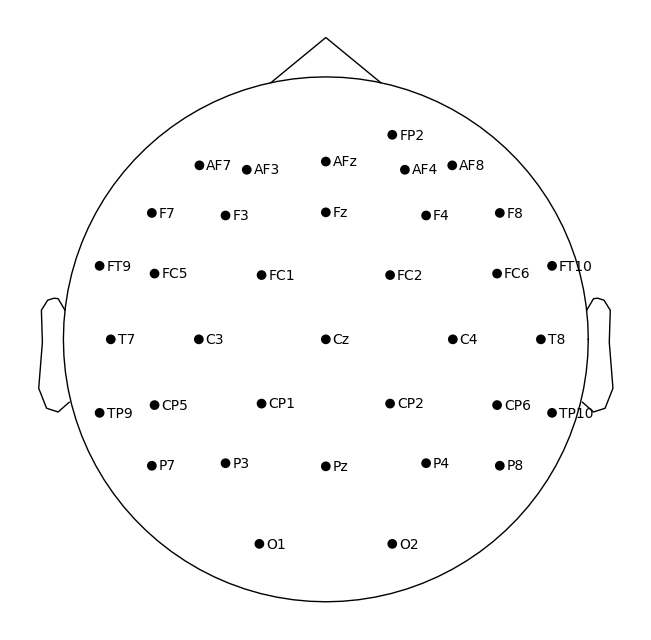

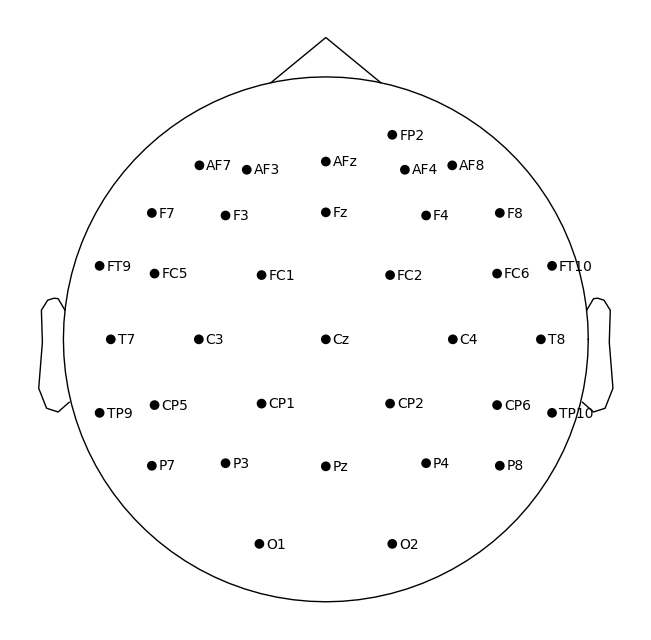

In [69]:
epochs_aff_odd.plot_sensors(show_names=True)

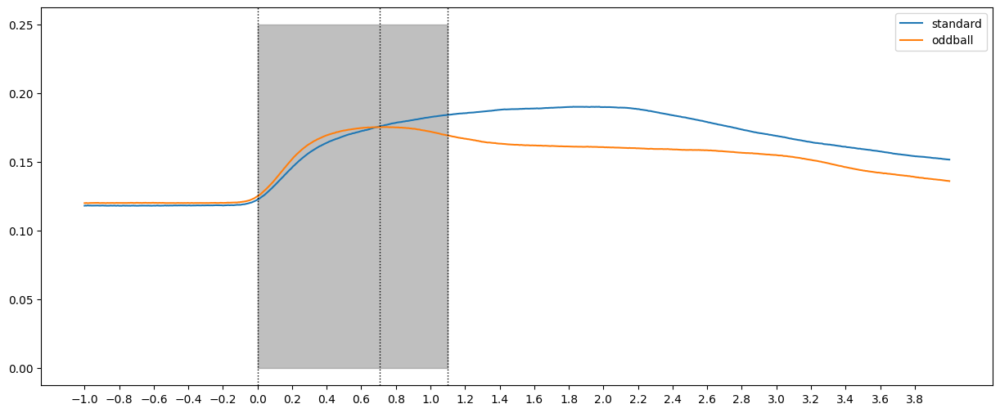

In [70]:
tmin = -1
tmax = 4
Dynmo_odd = epochs_aff_odd.copy().crop(tmin,tmax).get_data(picks='DynL(lc)')
Dynmo_odd= Dynmo_odd.reshape(Dynmo_odd.shape[0],Dynmo_odd.shape[2]).mean(axis=0)

Dynmo_typ = epochs_aff_typ.copy().crop(tmin,tmax).get_data(picks='DynL(lc)')
Dynmo_typ= Dynmo_typ.reshape(Dynmo_typ.shape[0],Dynmo_typ.shape[2]).mean(axis=0)

plt.figure(figsize=(15,6))

time= epochs_aff_typ.copy().crop(-1,tmax).times

plt.plot(epochs_aff_typ.copy().crop(-1,tmax).times,Dynmo_typ)
plt.plot(epochs_aff_odd.copy().crop(-1,tmax).times,Dynmo_odd)

x=np.arange(tmin,tmax,0.2)

plt.xticks(x)

f_max_time = np.argmax(epochs_aff_odd.copy().crop(0,1).get_data(picks='DynL(lc)').reshape(epochs_aff_odd.copy().crop(0,1).get_data(picks='DynL(lc)').shape[0],epochs_aff_odd.copy().crop(0,1).get_data(picks='DynL(lc)').shape[2]).mean(axis=0))/200

plt.axvline(0, linewidth=1, color="black", linestyle=":")

plt.axvline(f_max_time, linewidth=1, color="black", linestyle=":")

plt.axvline(1.1, linewidth=1, color="black", linestyle=":")
plt.fill_betweenx(np.array((0,0.25)), 1.1,0,color='gray', alpha=0.5)

plt.legend(['standard','oddball'])

In [71]:
f_max_time

0.705

Event-Related Potentials

In [72]:
evoked_odd = epochs_aff_odd.average()
evoked_typ = epochs_aff_typ.average()

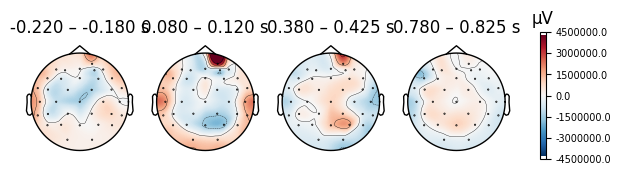

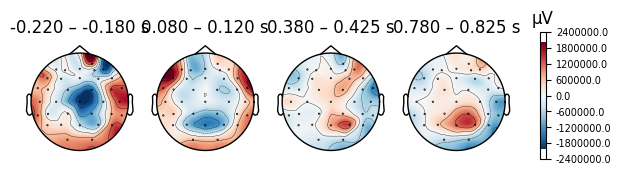

In [73]:
fig1 = evoked_odd.plot_topomap(times=[-0.2, 0.1, 0.4, 0.8], average=0.05)
fig2 = evoked_typ.plot_topomap(times=[-0.2, 0.1, 0.4, 0.8], average=0.05)

Time freq Analysis

In [74]:
tmin, tmax = -1, 4
freqs = np.arange(1, 30)  # frequencies from 2-100Hz

kwargs = dict(
    n_permutations=100, step_down_p=0.05, seed=1, buffer_size=None, out_type="mask"
)  # for cluster test

epochs_dbs = [epochs_aff_typ.copy().pick(['dbs']), epochs_aff_odd.copy().pick(['dbs'])]

epochs = [epochs_aff_typ.copy().pick(['eeg']), epochs_aff_odd.copy().pick(['eeg'])]

#del epochs_aff_typ, epochs_aff_odd

tfrs = []
for i, epoch in enumerate(epochs):
    
    """tfrs1 = mne.time_frequency.tfr_morlet(epoch, freqs=freqs, n_cycles=5,average=False, return_itc=False)
    
    tfrs1 = tfr_multitaper(
            epoch,
            freqs=freqs,
            n_cycles=7,
            use_fft=True,
            return_itc=False,
            average=False,
            decim=2,
            n_jobs=None
        )"""

    tfrs1 = epoch.compute_tfr(
        method="morlet",
        freqs=freqs,
        n_cycles=freqs,
        use_fft=True,
        return_itc=False,
        average=False,
        decim=1,
        n_jobs=50
    )



    
    tfrs1.crop(tmin, tmax)
    tfr_data = tfrs1.data
    #tfr_data = 10*np.log10(tfrs1.data) # applying log transformation 

    """Average Baseline"""       
    tfr_norm1 =[] 
    for ii,ch in enumerate(tfrs1.ch_names):
        x = np.hstack(tfr_data[:, ii, :, :]) # 3D dim = epoch* freq* time to 2D dim, freq * (time *epoch)
        x_mean=x.mean(axis=1) # mean of all the freqs across all the complete experiment session.
        tfr_norm=[]    
        for j in range(tfr_data[:, ii, :, :].shape[0]):
            tfr_norm.append(((tfr_data[j, ii, :, :].T-x_mean)/x_mean).T) # applying normalaization on each trail

        tfr_norm1.append(tfr_norm)
    tfr_norm1 = np.array(tfr_norm1)
    tfr_norm1 = np.rollaxis(tfr_norm1,1) # normalized tfr data
    
    
    event_id = dict( Standard=1,Oddball=101)
    tfrs1 = mne.time_frequency.EpochsTFR(tfrs1.info, tfr_norm1, tfrs1.times, tfrs1.freqs,comment=aff_cond_plot[i],events=epoch.events,event_id=event_id) 
    tfrs.append(tfrs1)

    
tfrs_dbs = []
for i, epoch in enumerate(epochs_dbs):
    
    """tfrs1_dbs = tfr_multitaper(
            epoch,
            freqs=freqs,
            n_cycles=7,
            use_fft=True,
            return_itc=False,
            average=False,
            decim=2,
        )
"""
    tfrs1_dbs = epoch.compute_tfr(
        method="morlet",
        freqs=freqs,
        n_cycles=freqs,
        use_fft=True,
        return_itc=False,
        average=False,
        decim=1,
        n_jobs=50
    )

    
    tfrs1_dbs.crop(tmin, tmax)

    tfr_data = tfrs1_dbs.data
    #tfr_data = 10*np.log10(tfrs1_dbs.data) # applying log transformation 
    
    """Average Baseline"""       
       
    tfr_norm1 =[] 
    for ii,ch in enumerate(tfrs1_dbs.ch_names):
        x = np.hstack(tfr_data[:, ii, :, :]) # 3D dim = epoch* freq* time to 2D dim, freq * (time *epoch)
        x_mean=x.mean(axis=1) # mean of all the freqs across all the complete experiment session.
        tfr_norm=[]    
        for j in range(tfr_data[:, ii, :, :].shape[0]):
            tfr_norm.append(((tfr_data[j, ii, :, :].T-x_mean)/x_mean).T) # applying normalaization on each trail

        tfr_norm1.append(tfr_norm)
    tfr_norm1 = np.array(tfr_norm1)
    tfr_norm1 = np.rollaxis(tfr_norm1,1) # normalized tfr data
 
    
    tfrs1_dbs = mne.time_frequency.EpochsTFR(tfrs1_dbs.info, tfr_norm1, tfrs1_dbs.times, tfrs1_dbs.freqs,comment=aff_cond_plot[i],events=epoch.events,event_id=event_id)
    tfrs_dbs.append(tfrs1_dbs)

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done   2 out of  35 | elapsed:    0.2s remaining:    2.9s
[Parallel(n_jobs=50)]: Done  10 out of  35 | elapsed:    0.9s remaining:    2.1s
[Parallel(n_jobs=50)]: Done  18 out of  35 | elapsed:    1.1s remaining:    1.0s
[Parallel(n_jobs=50)]: Done  26 out of  35 | elapsed:    1.2s remaining:    0.4s
[Parallel(n_jobs=50)]: Done  35 out of  35 | elapsed:    1.5s finished
/tmp/ipykernel_1851016/246817875.py:63: FutureWarning: Parameters "info", "data", "times", "comment" are deprecated and will be removed in version 1.8. For a quick fix, use ``EpochsTFRArray`` with the same parameters. For a long-term fix, see the docstring notes.
  tfrs1 = mne.time_frequency.EpochsTFR(tfrs1.info, tfr_norm1, tfrs1.times, tfrs1.freqs,comment=aff_cond_plot[i],events=epoch.events,event_id=event_id)
[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done   2 out 

No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied


/tmp/ipykernel_1851016/1305743471.py:23: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1851016/1305743471.py:23: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1851016/1305743471.py:23: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1851016/1305743471.py:23: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1851016/1305743471.py:23: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(


No baseline correction applied
No baseline correction applied
No baseline correction applied


/tmp/ipykernel_1851016/1305743471.py:23: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1851016/1305743471.py:23: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1851016/1305743471.py:23: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(


No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied


/tmp/ipykernel_1851016/1305743471.py:23: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1851016/1305743471.py:23: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1851016/1305743471.py:23: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1851016/1305743471.py:23: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1851016/1305743471.py:23: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(


No baseline correction applied
No baseline correction applied
No baseline correction applied


/tmp/ipykernel_1851016/1305743471.py:23: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1851016/1305743471.py:23: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1851016/1305743471.py:23: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(


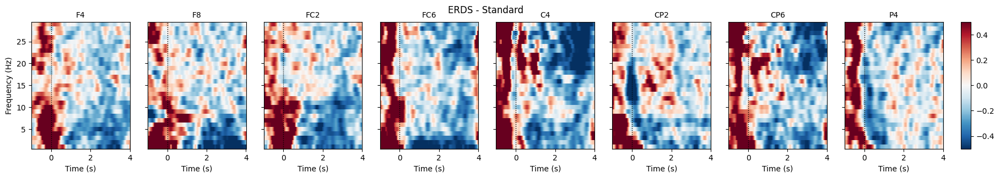

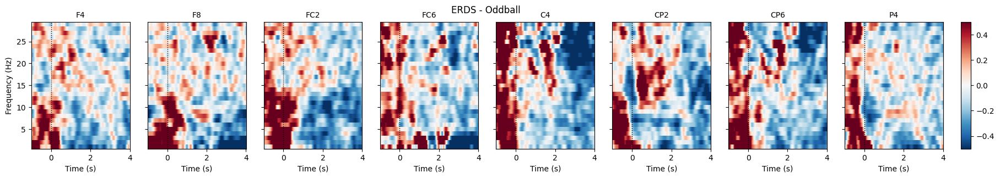

In [75]:
vmin, vmax = -0.5, 0.5  # set min and max ERDS values in plot
cnorm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)  # min, center & max ERDS
if subj_list == ['013'] or subj_list == ['014'] or subj_list == ['015']:
    ch_picks =['F4','F8','FC2','FC6','C4','CP2','CP6','P4']
else:
    ch_picks =['F8','F4','FC6','FC2','C4','CP6','CP2','P4']

for n, tfr in enumerate(tfrs):
    chs =[]
    for i, ch_name in enumerate(epochs[n].info.ch_names):
        if  ch_name in ch_picks: 
            chs.append(i)
    
    width_ratios=[10]*len(chs)
    width_ratios.extend([1])
    
    fig, axes = plt.subplots(
            1, len(chs)+1, figsize=(22, 3), gridspec_kw={"width_ratios": width_ratios}
        )
    # positive clusters
    for ch, ax in enumerate(axes[:-1]):

        tfr.average().plot(
                    [epochs[n].info.ch_names[chs[ch]]],
                    axes=ax,
                    colorbar=False,
                    cnorm=cnorm,
                    show=False,
                    mask_style="mask",
                )
        ax.set_title(epochs[0].info.ch_names[chs[ch]], fontsize=10)
        ax.axvline(0, linewidth=1, color="black", linestyle=":")  # event
        
        if ch != 0:
            ax.set_ylabel("")
            ax.set_yticklabels("")
    fig.colorbar(axes[0].images[-1], cax=axes[-1]).ax.set_yscale("linear")
    fig.suptitle(f"ERDS - {aff_cond_plot[n]}")

Using a threshold of 1.677927
stat_fun(H1): min=-230.90944847519603 max=3.5422014855828152
Running initial clustering …
Found 6 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.677927
stat_fun(H1): min=-230.90944847519603 max=3.5422014855828152
Running initial clustering …
Found 5 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.677927
stat_fun(H1): min=-128.30298443110215 max=3.0575113572045676
Running initial clustering …
Found 6 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 1 cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.677927
stat_fun(H1): min=-128.30298443110215 max=3.0575113572045676
Running initial clustering …
Found 9 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.677927
stat_fun(H1): min=-268.9659887167529 max=3.074084220566944
Running initial clustering …
Found 3 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.677927
stat_fun(H1): min=-268.9659887167529 max=3.074084220566944
Running initial clustering …
Found 4 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.677927
stat_fun(H1): min=-45.379706331866295 max=3.146753732541549
Running initial clustering …
Found 9 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 1 cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.677927
stat_fun(H1): min=-45.379706331866295 max=3.146753732541549
Running initial clustering …
Found 15 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.677927
stat_fun(H1): min=-508.12398355457805 max=2.656745349320566
Running initial clustering …
Found 3 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.677927
stat_fun(H1): min=-508.12398355457805 max=2.656745349320566
Running initial clustering …
Found 8 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.677927
stat_fun(H1): min=-123.96430717790595 max=2.7700881516210716
Running initial clustering …
Found 7 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.677927
stat_fun(H1): min=-123.96430717790595 max=2.7700881516210716
Running initial clustering …
Found 6 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.677927
stat_fun(H1): min=-12.413754412655937 max=3.7294944773500314
Running initial clustering …
Found 13 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 1 cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.677927
stat_fun(H1): min=-12.413754412655937 max=3.7294944773500314
Running initial clustering …
Found 21 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 3 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.677927
stat_fun(H1): min=-62.292003175110885 max=3.694738330801452
Running initial clustering …
Found 6 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 1 cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.677927
stat_fun(H1): min=-62.292003175110885 max=3.694738330801452
Running initial clustering …
Found 19 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.677927
stat_fun(H1): min=-101.75645873838313 max=3.308645876793543
Running initial clustering …
Found 4 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.677927
stat_fun(H1): min=-101.75645873838313 max=3.308645876793543
Running initial clustering …
Found 6 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 1 additional cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #3 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.677927
stat_fun(H1): min=-59.55782200177579 max=2.9310388853426397
Running initial clustering …
Found 13 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.677927
stat_fun(H1): min=-59.55782200177579 max=2.9310388853426397
Running initial clustering …
Found 13 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 1 additional cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #3 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.677927
stat_fun(H1): min=-122.15868822630515 max=3.0861970801414413
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.677927
stat_fun(H1): min=-122.15868822630515 max=3.0861970801414413
Running initial clustering …
Found 5 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 1 additional cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #3 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.677927
stat_fun(H1): min=-25.323813352640336 max=3.4670842497543197
Running initial clustering …
Found 8 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 1 cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.677927
stat_fun(H1): min=-25.323813352640336 max=3.4670842497543197
Running initial clustering …
Found 16 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.677927
stat_fun(H1): min=-139.8991456818135 max=3.594881938361612
Running initial clustering …
Found 7 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.677927
stat_fun(H1): min=-139.8991456818135 max=3.594881938361612
Running initial clustering …
Found 13 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 1 additional cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #3 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.677927
stat_fun(H1): min=-45.194306926598834 max=2.834613850072345
Running initial clustering …
Found 6 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.677927
stat_fun(H1): min=-45.194306926598834 max=2.834613850072345
Running initial clustering …
Found 17 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 2 additional clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #3 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.677927
stat_fun(H1): min=-10.604621902871461 max=3.649270333240097
Running initial clustering …
Found 7 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.677927
stat_fun(H1): min=-10.604621902871461 max=3.649270333240097
Running initial clustering …
Found 17 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 4 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.677927
stat_fun(H1): min=-16.675582077889754 max=3.533990076652996
Running initial clustering …
Found 12 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 1 cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.677927
stat_fun(H1): min=-16.675582077889754 max=3.533990076652996
Running initial clustering …
Found 14 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 1 additional cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #3 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied


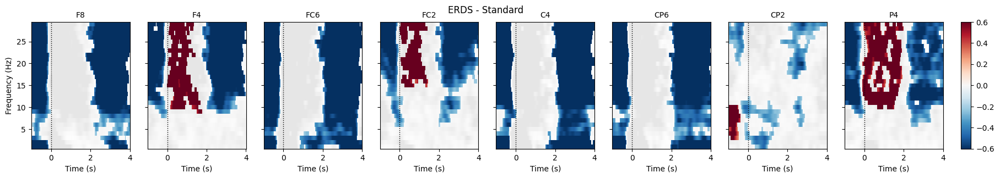

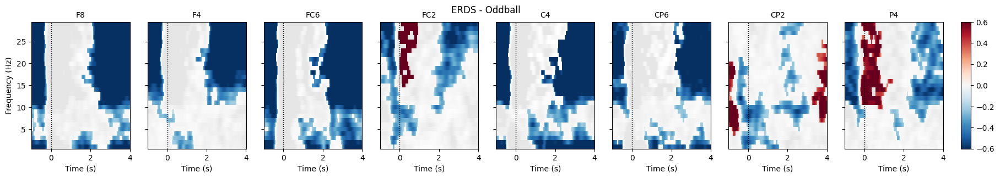

In [8]:
vmin, vmax = -0.6, 0.6 # set min and max ERDS values in plot
cnorm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)  # min, center & max ERDS

for n, tfr in enumerate(tfrs):
    chs =[]
    for i, ch_name in enumerate(epochs[n].info.ch_names):
        if  ch_name in ch_picks: 
            chs.append(i)
    
    width_ratios=[10]*len(chs)
    width_ratios.extend([1])
    
    fig, axes = plt.subplots(
            1, len(chs)+1, figsize=(22, 3), gridspec_kw={"width_ratios": width_ratios}
        )
    
    # positive clusters
    for ch, ax in enumerate(axes[:-1]):
        _, c1, p1, _ = pcluster_test(tfrs[n].data[:, chs[ch]], tail=1, **kwargs)
            # negative clusters
        _, c2, p2, _ = pcluster_test(tfrs[n].data[:, chs[ch]], tail=-1, **kwargs)
        
                # note that we keep clusters with p <= 0.05 from the combined clusters
                # of two independent tests; in this example, we do not correct for
                # these two comparisons
        c = np.stack(c1 + c2, axis=2)  # combined clusters
        p = np.concatenate((p1, p2))  # combined p-values

        mask = c[..., p <= 0.05].any(axis=-1)
        # plot TFR (ERDS map with masking)
        tfr.average().plot(
                    [epochs[n].info.ch_names[chs[ch]]],
                    axes=ax,
                    colorbar=False,
                    cnorm=cnorm,
                    show=False,
                    mask = mask,
                    mask_style="mask",
                )
        ax.set_title(epochs[0].info.ch_names[chs[ch]], fontsize=10)
        ax.axvline(0, linewidth=1, color="black", linestyle=":")  # event
        
        if ch != 0:
            ax.set_ylabel("")
            ax.set_yticklabels("")
    fig.colorbar(axes[0].images[-1], cax=axes[-1]).ax.set_yscale("linear")
    fig.suptitle(f"ERDS - {aff_cond_plot[n]}")

No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied


/tmp/ipykernel_1296690/3893086378.py:17: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1296690/3893086378.py:17: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1296690/3893086378.py:17: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1296690/3893086378.py:17: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1296690/3893086378.py:17: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1296690/3893086378.py:17: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1296690/3893086378.py:17: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1296690/3893086378.py:17: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1296690/3893086378.py:17:

No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied


/tmp/ipykernel_1296690/3893086378.py:17: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1296690/3893086378.py:17: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1296690/3893086378.py:17: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1296690/3893086378.py:17: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1296690/3893086378.py:17: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1296690/3893086378.py:17: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1296690/3893086378.py:17: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1296690/3893086378.py:17: RuntimeWarning: `mask` is None, not masking the plot ...
  tfr.average().plot(
/tmp/ipykernel_1296690/3893086378.py:17:

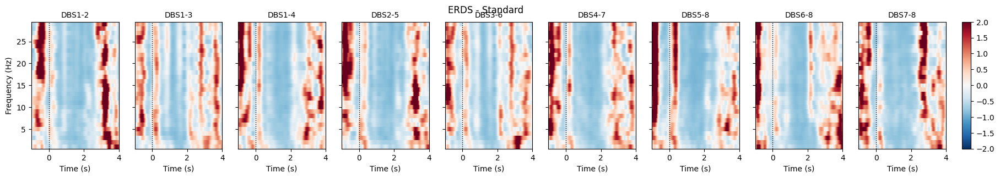

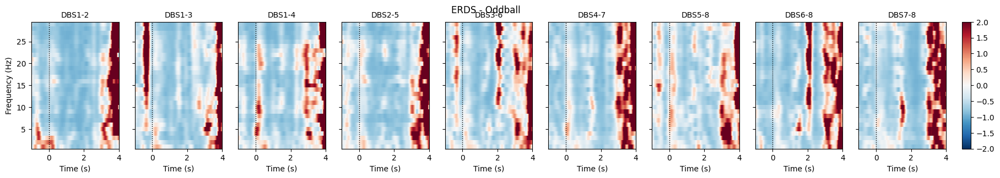

In [27]:
vmin, vmax = -2, 2  # set min and max ERDS values in plot
cnorm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)  # min, center & max ERDS
    
for n, tfr in enumerate(tfrs_dbs):
    chs = list(range(0, len(epochs_dbs[0].info.ch_names)))
    
    width_ratios=[10]*len(chs)
    width_ratios.extend([1])
    
    fig, axes = plt.subplots(
            1, len(chs)+1, figsize=(22, 3), gridspec_kw={"width_ratios": width_ratios}
        )
    # positive clusters
    for ch, ax in enumerate(axes[:-1]):

        # plot TFR (ERDS map with masking)
        tfr.average().plot(
                    [epochs_dbs[n].info.ch_names[chs[ch]]],
                    axes=ax,
                    colorbar=False,
                    cnorm=cnorm,
                    show=False,
                    mask_style="mask",
                )
        ax.set_title(epochs_dbs[0].info.ch_names[chs[ch]], fontsize=10)
        ax.axvline(0, linewidth=1, color="black", linestyle=":")  # event
        
        if ch != 0:
            ax.set_ylabel("")
            ax.set_yticklabels("")
    fig.colorbar(axes[0].images[-1], cax=axes[-1]).ax.set_yscale("linear")
    fig.suptitle(f"ERDS - {aff_cond_plot[n]}")

Using a threshold of 1.664885
stat_fun(H1): min=-4.125120 max=2.911996
Running initial clustering …
Found 42 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.664885
stat_fun(H1): min=-4.125120 max=2.911996
Running initial clustering …
Found 36 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied
Using a threshold of 1.664885
stat_fun(H1): min=-3.371313 max=2.910012
Running initial clustering …
Found 45 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.664885
stat_fun(H1): min=-3.371313 max=2.910012
Running initial clustering …
Found 63 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied
Using a threshold of 1.664885
stat_fun(H1): min=-4.395045 max=4.359085
Running initial clustering …
Found 71 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.664885
stat_fun(H1): min=-4.395045 max=4.359085
Running initial clustering …
Found 43 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied
Using a threshold of 1.664885
stat_fun(H1): min=-3.037571 max=3.074375
Running initial clustering …
Found 72 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.664885
stat_fun(H1): min=-3.037571 max=3.074375
Running initial clustering …
Found 81 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied
Using a threshold of 1.664885
stat_fun(H1): min=-5.802502 max=3.841446
Running initial clustering …
Found 74 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.664885
stat_fun(H1): min=-5.802502 max=3.841446
Running initial clustering …
Found 29 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied
Using a threshold of 1.664885
stat_fun(H1): min=-5.218377 max=4.749559
Running initial clustering …
Found 83 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.664885
stat_fun(H1): min=-5.218377 max=4.749559
Running initial clustering …
Found 82 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied
Using a threshold of 1.664885
stat_fun(H1): min=-4.658951 max=3.535396
Running initial clustering …
Found 38 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.664885
stat_fun(H1): min=-4.658951 max=3.535396
Running initial clustering …
Found 64 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied
Using a threshold of 1.664885
stat_fun(H1): min=-3.591548 max=3.536920
Running initial clustering …
Found 63 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.664885
stat_fun(H1): min=-3.591548 max=3.536920
Running initial clustering …
Found 54 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied
Using a threshold of 1.664885
stat_fun(H1): min=-3.469888 max=4.395633
Running initial clustering …
Found 57 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.664885
stat_fun(H1): min=-3.469888 max=4.395633
Running initial clustering …
Found 78 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied
Using a threshold of 1.664885
stat_fun(H1): min=-4.065825 max=5.118883
Running initial clustering …
Found 33 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 1 cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.664885
stat_fun(H1): min=-4.065825 max=5.118883
Running initial clustering …
Found 72 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied
Using a threshold of 1.664885
stat_fun(H1): min=-3.653699 max=3.138864
Running initial clustering …
Found 50 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.664885
stat_fun(H1): min=-3.653699 max=3.138864
Running initial clustering …
Found 81 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied
Using a threshold of 1.664885
stat_fun(H1): min=-5.145840 max=4.795498
Running initial clustering …
Found 57 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 1 cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.664885
stat_fun(H1): min=-5.145840 max=4.795498
Running initial clustering …
Found 47 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied
Using a threshold of 1.664885
stat_fun(H1): min=-4.653421 max=5.172388
Running initial clustering …
Found 46 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.664885
stat_fun(H1): min=-4.653421 max=5.172388
Running initial clustering …
Found 47 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied
Using a threshold of 1.664885
stat_fun(H1): min=-5.112424 max=3.867451
Running initial clustering …
Found 48 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
Using a threshold of -1.664885
stat_fun(H1): min=-5.112424 max=3.867451
Running initial clustering …
Found 51 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


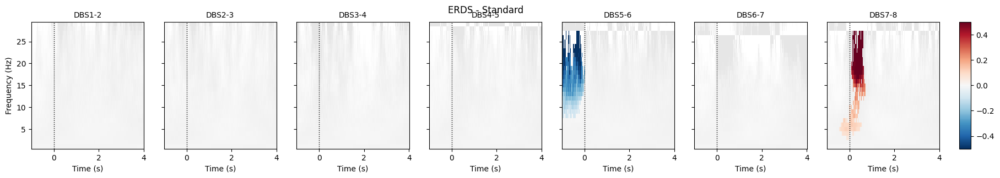

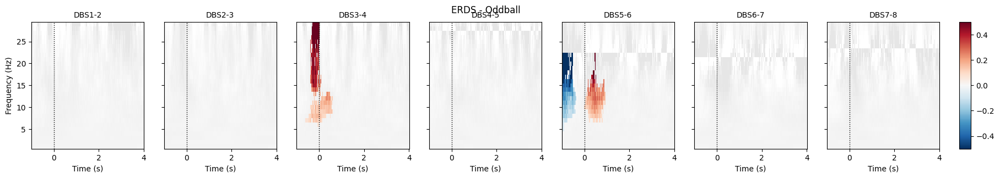

In [25]:
vmin, vmax = -0.5, 0.5  # set min and max ERDS values in plot
cnorm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)  # min, center & max ERDS
    
for n, tfr in enumerate(tfrs_dbs):
    chs = list(range(0, len(epochs_dbs[0].info.ch_names)))
    
    width_ratios=[10]*len(chs)
    width_ratios.extend([1])
    
    fig, axes = plt.subplots(
            1, len(chs)+1, figsize=(22, 3), gridspec_kw={"width_ratios": width_ratios}
        )
    # positive clusters
    for ch, ax in enumerate(axes[:-1]):
        _, c1, p1, _ = pcluster_test(tfrs_dbs[n].data[:, chs[ch]], tail=1, **kwargs)
            # negative clusters
        _, c2, p2, _ = pcluster_test(tfrs_dbs[n].data[:, chs[ch]], tail=-1, **kwargs)
        
                # note that we keep clusters with p <= 0.05 from the combined clusters
                # of two independent tests; in this example, we do not correct for
                # these two comparisons
        c = np.stack(c1 + c2, axis=2)  # combined clusters
        p = np.concatenate((p1, p2))  # combined p-values

        mask = c[..., p <= 0.05].any(axis=-1)
        # plot TFR (ERDS map with masking)
        tfrs_dbs[n].average().plot(
                    [epochs_dbs[n].info.ch_names[chs[ch]]],
                    axes=ax,
                    colorbar=False,
                    cnorm=cnorm,
                    show=False,
                    mask = mask,
                    mask_style="mask",
                )
        ax.set_title(epochs_dbs[0].info.ch_names[chs[ch]], fontsize=10)
        ax.axvline(0, linewidth=1, color="black", linestyle=":")  # event
        
        if ch != 0:
            ax.set_ylabel("")
            ax.set_yticklabels("")
    fig.colorbar(axes[0].images[-1], cax=axes[-1]).ax.set_yscale("linear")
    fig.suptitle(f"ERDS - {aff_cond_plot[n]}")

ERDS to Excel

In [76]:
df1 = tfrs[0].copy().pick(ch_picks).to_data_frame(time_format=None, long_format=True)
df2 = tfrs[1].copy().pick(ch_picks).to_data_frame(time_format=None, long_format=True)
df3 = tfrs_dbs[0].to_data_frame(time_format=None, long_format=True)
df4 = tfrs_dbs[1].to_data_frame(time_format=None, long_format=True)

frames = [df1, df2, df3, df4]
df = pd.concat(frames)
# Map to frequency bands:
freq_bounds = {"_": 0, "[0 3]": 4, "[4 7]": 8, "[8 12]": 13, "[13 20]": 20, "[21 30]": 30}
time_bounds = {"_": -0.5, "[-0.5 0]": 0, f'[0 {f_max_time} ]': f_max_time, f'[{f_max_time} 1.1]': 1.1, "[1.1, 1.5]": 1.5, "[1.5 2]": 2}


df["band"] = pd.cut(
    df["freq"], list(freq_bounds.values()), labels=list(freq_bounds)[1:]
)

df["Time_dur"] = pd.cut(
    df["time"], list(time_bounds.values()), labels=list(time_bounds)[1:]
)

# Filter to retain only relevant frequency bands:
freq_bands_of_interest = ["[4 7]","[8 12]", "[13 20]", "[21 30]"]
time_of_interest = ["[-0.5 0]", f'[0 {f_max_time} ]', f'[{f_max_time} 1.1]', "[1.1, 1.5]", "[1.5 2]"]

df = df[df.band.isin(freq_bands_of_interest)]
df = df[df.Time_dur.isin(time_of_interest)]

df["band"] = df["band"].cat.remove_unused_categories()
df["Time_dur"] = df["Time_dur"].cat.remove_unused_categories()


df_mean = (
    df.groupby(["condition", "Time_dur", "band", "channel"], observed=False)[["value"]]
    .mean()
    .reset_index()
)
df_mean.insert(0,'Stage', len(df_mean)*[st])
df_mean.insert(1,'Subject', len(df_mean)*[sub])

Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...
Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...
Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...
Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...


In [77]:
time_bounds

{'_': -0.5,
 '[-0.5 0]': 0,
 '[0 0.705 ]': 0.705,
 '[0.705 1.1]': 1.1,
 '[1.1, 1.5]': 1.5,
 '[1.5 2]': 2}

In [78]:
time_of_interest

['[-0.5 0]', '[0 0.705 ]', '[0.705 1.1]', '[1.1, 1.5]', '[1.5 2]']

In [79]:
df_mean.head(140)

,Stage,Subject,condition,Time_dur,band,channel,value
0,implant,015,Oddball,[-0.5 0],[4 7],C4,0.634945
1,implant,015,Oddball,[-0.5 0],[4 7],CP2,0.590348
2,implant,015,Oddball,[-0.5 0],[4 7],CP6,0.614651
3,implant,015,Oddball,[-0.5 0],[4 7],DBS1-2,0.160548
4,implant,015,Oddball,[-0.5 0],[4 7],DBS2-3,0.498716
...,...,...,...,...,...,...,...
135,implant,015,Oddball,[0.705 1.1],[8 12],C4,-0.031740
136,implant,015,Oddball,[0.705 1.1],[8 12],CP2,0.161633
137,implant,015,Oddball,[0.705 1.1],[8 12],CP6,-0.073352
138,implant,015,Oddball,[0.705 1.1],[8 12],DBS1-2,-0.041812


In [80]:
df_mean.to_csv('Oddball_ERDS_morlet.csv', mode='a', index=False, header=False)

Plot ERDS

Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...
Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...


/home/malann/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/malann/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/malann/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


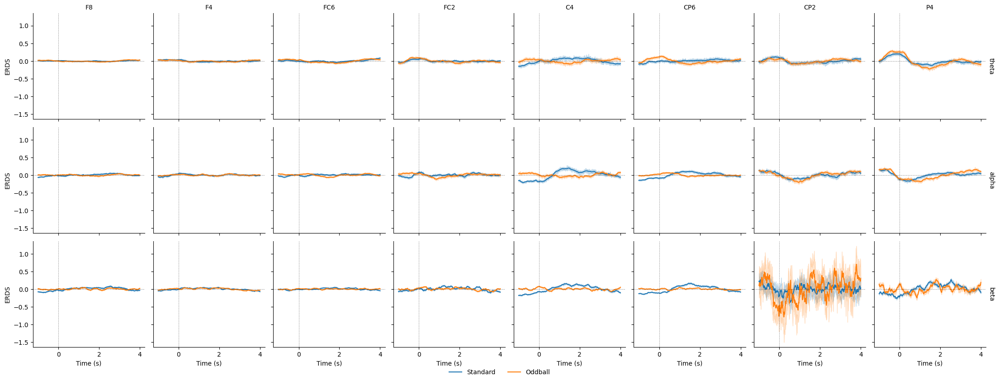

In [26]:
df1 = tfrs[0].copy().pick(ch_picks).to_data_frame(time_format=None, long_format=True)
df2 = tfrs[1].copy().pick(ch_picks).to_data_frame(time_format=None, long_format=True)
frames = [df1, df2]
df = pd.concat(frames)
# Map to frequency bands:
freq_bounds = {"_": 0, "delta": 3, "theta": 7, "alpha": 13, "beta": 30, "gamma": 90}

df["band"] = pd.cut(
    df["freq"], list(freq_bounds.values()), labels=list(freq_bounds)[1:]
)

# Filter to retain only relevant frequency bands:
freq_bands_of_interest = ["theta", "alpha", "beta"]
df = df[df.band.isin(freq_bands_of_interest)]
df["band"] = df["band"].cat.remove_unused_categories()

# Order channels for plotting:
# df["channel"] = df["channel"].cat.reorder_categories(('F4','Fz','F3','FC2','FC1','C3','Cz','C4','CP2','CP1'), ordered=True)

df["channel"] = df["channel"].cat.reorder_categories((ch_picks), ordered=True)


g = sns.FacetGrid(df, row="band", col="channel", margin_titles=True)
g.map(sns.lineplot, "time", "value", "condition", n_boot=10)
axline_kw = dict(color="black", linestyle="dashed", linewidth=0.5, alpha=0.5)
g.map(plt.axhline, y=0, **axline_kw)
g.map(plt.axvline, x=0, **axline_kw)
g.set(ylim=(None,None))
g.set_axis_labels("Time (s)", "ERDS")
g.set_titles(col_template="{col_name}", row_template="{row_name}")
g.add_legend(ncol=2, loc="lower center")
g.fig.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.08)

Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...
Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...


/home/malann/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/malann/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/malann/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


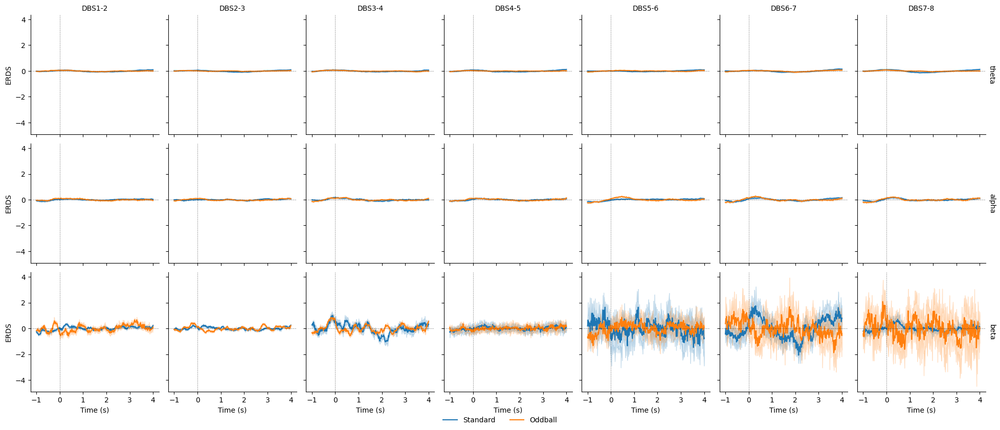

In [27]:
df1 = tfrs_dbs[0].to_data_frame(time_format=None, long_format=True)
df2 = tfrs_dbs[1].to_data_frame(time_format=None, long_format=True)
frames = [df1, df2]
df = pd.concat(frames)
# Map to frequency bands:
freq_bounds = {"_": 0, "delta": 3, "theta": 7, "alpha": 13, "beta": 30, "gamma": 90}

df["band"] = pd.cut(
    df["freq"], list(freq_bounds.values()), labels=list(freq_bounds)[1:]
)

# Filter to retain only relevant frequency bands:
freq_bands_of_interest = ["theta", "alpha", "beta"]
df = df[df.band.isin(freq_bands_of_interest)]
df["band"] = df["band"].cat.remove_unused_categories()

# Order channels for plotting:

#df["channel"] = df["channel"].cat.reorder_categories(('FC2','C4','CP2'), ordered=True)

g = sns.FacetGrid(df, row="band", col="channel", margin_titles=True)
g.map(sns.lineplot, "time", "value", "condition", n_boot=10)
axline_kw = dict(color="black", linestyle="dashed", linewidth=0.5, alpha=0.5)
g.map(plt.axhline, y=0, **axline_kw)
g.map(plt.axvline, x=0, **axline_kw)
g.set(ylim=(None, None))
g.set_axis_labels("Time (s)", "ERDS")
g.set_titles(col_template="{col_name}", row_template="{row_name}")
g.add_legend(ncol=2, loc="lower center")
g.fig.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.08)

In [28]:
tfrs_dbs[0].ch_names

['DBS1-2', 'DBS2-3', 'DBS3-4', 'DBS4-5', 'DBS5-6', 'DBS6-7', 'DBS7-8']

Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...
Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...


/home/malann/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/malann/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/malann/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


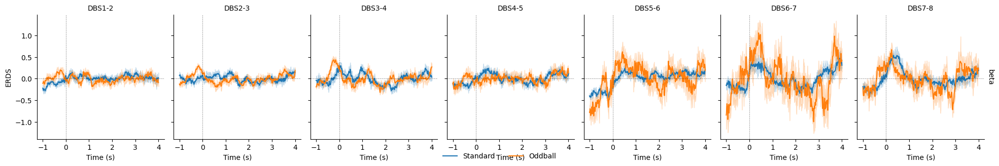

In [29]:
df1 = tfrs_dbs[0].copy().pick(['DBS1-2', 'DBS2-3', 'DBS3-4', 'DBS4-5', 'DBS5-6', 'DBS6-7', 'DBS7-8']).to_data_frame(time_format=None, long_format=True)
df2 = tfrs_dbs[1].copy().pick(['DBS1-2', 'DBS2-3', 'DBS3-4', 'DBS4-5', 'DBS5-6', 'DBS6-7', 'DBS7-8']).to_data_frame(time_format=None, long_format=True)
frames = [df1, df2]
df = pd.concat(frames)
# Map to frequency bands:
freq_bounds = {"_": 0, "delta": 3, "theta": 7, "alpha": 13, "beta": 20, "gamma": 90}

df["band"] = pd.cut(
    df["freq"], list(freq_bounds.values()), labels=list(freq_bounds)[1:]
)

# Filter to retain only relevant frequency bands:
freq_bands_of_interest = ["beta"]
df = df[df.band.isin(freq_bands_of_interest)]
df["band"] = df["band"].cat.remove_unused_categories()

# Order channels for plotting:

df["channel"] = df["channel"].cat.reorder_categories(('DBS1-2', 'DBS2-3', 'DBS3-4', 'DBS4-5', 'DBS5-6', 'DBS6-7', 'DBS7-8'), ordered=True)

g = sns.FacetGrid(df, row="band", col="channel", margin_titles=True)
g.map(sns.lineplot, "time", "value", "condition", n_boot=10)
axline_kw = dict(color="black", linestyle="dashed", linewidth=0.5, alpha=0.5)
g.map(plt.axhline, y=0, **axline_kw)
g.map(plt.axvline, x=0, **axline_kw)
g.set(ylim=(None, None))
g.set_axis_labels("Time (s)", "ERDS")
g.set_titles(col_template="{col_name}", row_template="{row_name}")
g.add_legend(ncol=2, loc="lower center")
g.fig.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.08)

Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...
Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...


/home/malann/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/malann/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


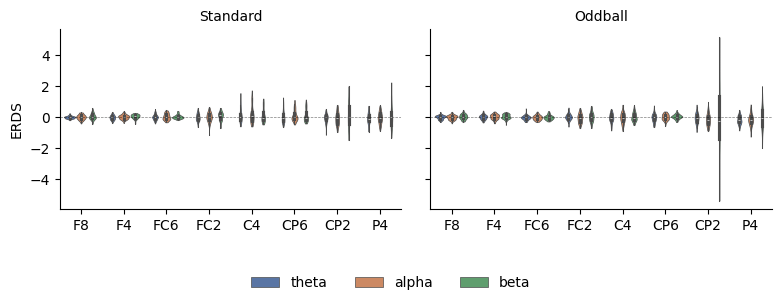

In [30]:
df1 = tfrs[0].copy().crop(0,1.2).pick(ch_picks).to_data_frame(time_format=None, long_format=True)
df2 = tfrs[1].copy().crop(0,1.2).pick(ch_picks).to_data_frame(time_format=None, long_format=True)
frames = [df1, df2]
df = pd.concat(frames)
# Map to frequency bands:
freq_bounds = {"_": 0, "delta": 3, "theta": 7, "alpha": 13, "beta": 30, "gamma": 90}

df["band"] = pd.cut(
    df["freq"], list(freq_bounds.values()), labels=list(freq_bounds)[1:]
)

# Filter to retain only relevant frequency bands:
freq_bands_of_interest = ["theta", "alpha", "beta"]
df = df[df.band.isin(freq_bands_of_interest)]
df["band"] = df["band"].cat.remove_unused_categories()

# Order channels for plotting:
# df["channel"] = df["channel"].cat.reorder_categories(('F4','Fz','F3','FC2','FC1','C3','Cz','C4','CP2','CP1'), ordered=True)

df["channel"] = df["channel"].cat.reorder_categories((ch_picks), ordered=True)




df_mean = (
    df.query("time > 1")
    .groupby(["condition", "epoch", "band", "channel"], observed=False)[["value"]]
    .mean()
    .reset_index()
)

g = sns.FacetGrid(
    df_mean, col="condition", col_order=["Standard", "Oddball"], margin_titles=True
)
g = g.map(
    sns.violinplot,
    "channel",
    "value",
    "band",
    cut=0,
    palette="deep",
    order=ch_picks,
    hue_order=freq_bands_of_interest,
    linewidth=0.5,
).add_legend(ncol=4, loc="lower center")

g.map(plt.axhline, **axline_kw)
g.set_axis_labels("", "ERDS")
g.set_titles(col_template="{col_name}", row_template="{row_name}")
g.fig.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.3)

Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...
Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...


/home/malann/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/malann/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


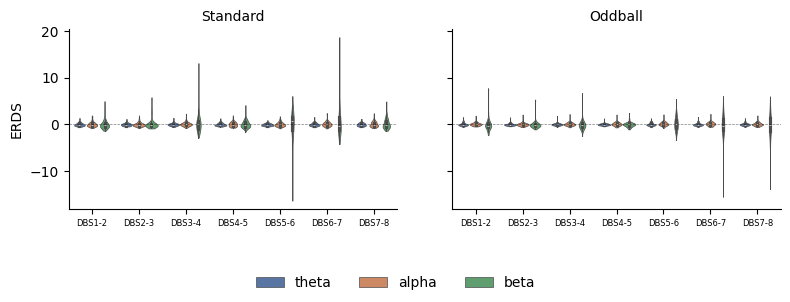

In [31]:
df1 = tfrs_dbs[0].copy().crop(0,1.2).to_data_frame(time_format=None, long_format=True)
df2 = tfrs_dbs[1].copy().crop(0,1.2).to_data_frame(time_format=None, long_format=True)
frames = [df1, df2]
df = pd.concat(frames)
# Map to frequency bands:
freq_bounds = {"_": 0, "delta": 3, "theta": 7, "alpha": 13, "beta": 30, "gamma": 90}

df["band"] = pd.cut(
    df["freq"], list(freq_bounds.values()), labels=list(freq_bounds)[1:]
)

# Filter to retain only relevant frequency bands:
freq_bands_of_interest = ["theta", "alpha", "beta"]
df = df[df.band.isin(freq_bands_of_interest)]
df["band"] = df["band"].cat.remove_unused_categories()
df_mean = (
    df.query("time > 0")
    .groupby(["condition", "epoch", "band", "channel"], observed=False)[["value"]]
    .mean()
    .reset_index()
)

g = sns.FacetGrid(
    df_mean, col="condition", col_order=["Standard", "Oddball"], margin_titles=True
)
g = g.map(
    sns.violinplot,
    "channel",
    "value",
    "band",
    cut=0,
    palette="deep",
    order=epochs_dbs[0].info.ch_names,
    hue_order=freq_bands_of_interest,
    linewidth=0.5,
).add_legend(ncol=4, loc="lower center")

g.map(plt.axhline, **axline_kw)
g.set_axis_labels("", "ERDS")
g.set_xticklabels(size = 6)
g.set_titles(col_template="{col_name}", row_template="{row_name}")
g.fig.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.3)

TFR Permutation test (Oddball vs Standard)

stat_fun(H1): min=0.000000 max=13.454679
Running initial clustering …
Found 20 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

/tmp/ipykernel_187178/726773413.py:51: RuntimeWarning: All-NaN slice encountered
  max_t = np.nanmax(abs(t_obs_plot))


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


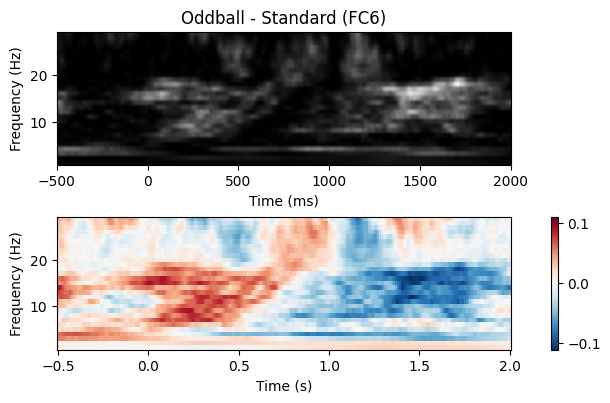

stat_fun(H1): min=0.000000 max=11.526931
Running initial clustering …
Found 8 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


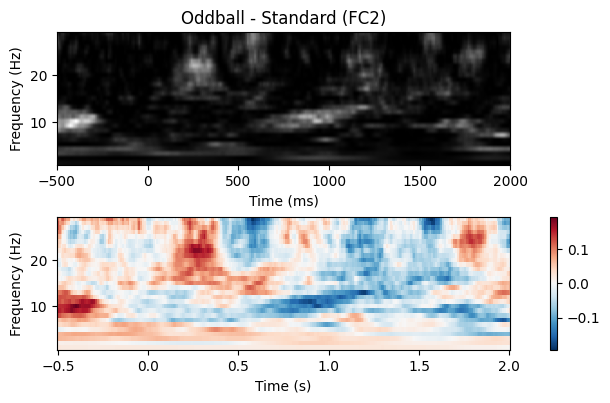

stat_fun(H1): min=0.000000 max=19.186735
Running initial clustering …
Found 14 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


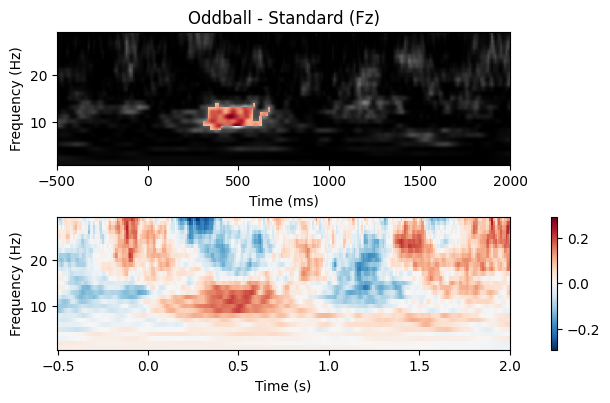

stat_fun(H1): min=0.000000 max=19.940351
Running initial clustering …
Found 6 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


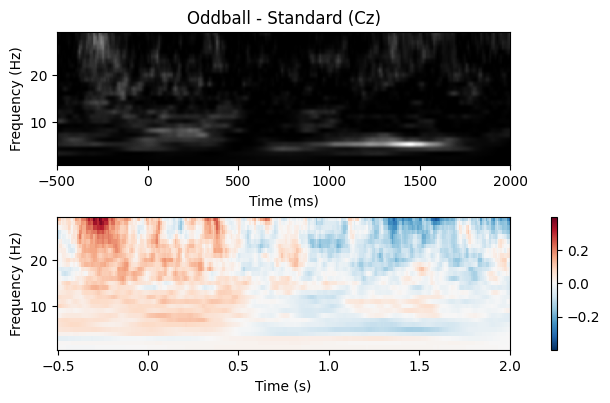

stat_fun(H1): min=0.000000 max=35.329010
Running initial clustering …
Found 32 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


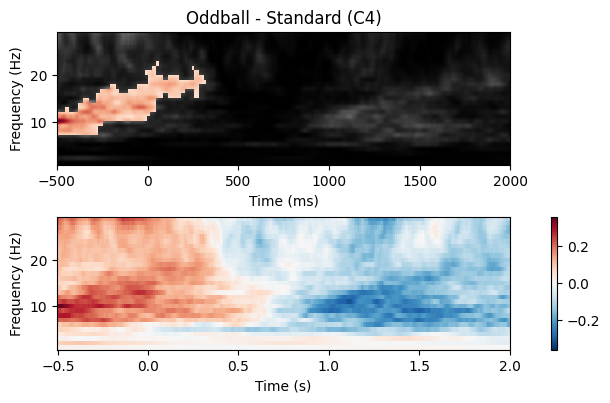

stat_fun(H1): min=0.000000 max=19.126567
Running initial clustering …
Found 14 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


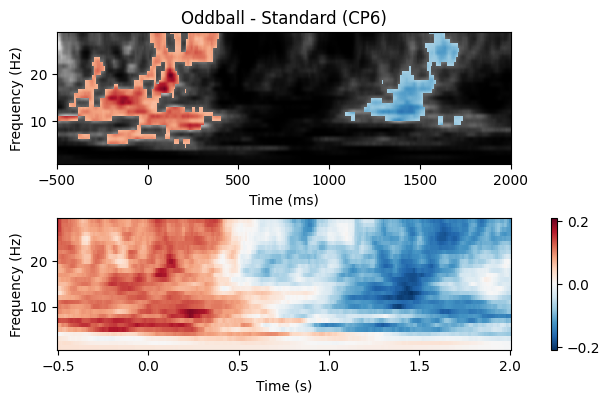

stat_fun(H1): min=0.000000 max=13.875659
Running initial clustering …
Found 8 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


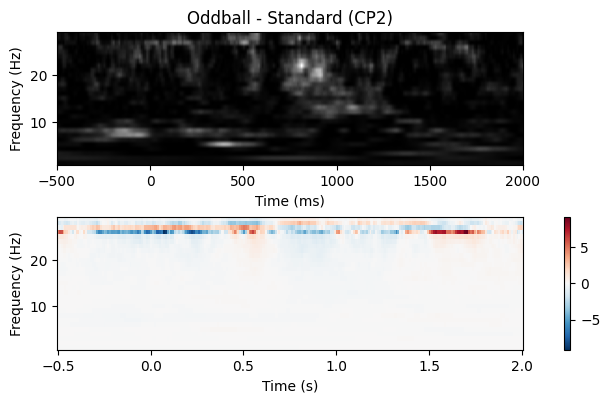

stat_fun(H1): min=0.000000 max=18.802631
Running initial clustering …
Found 26 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


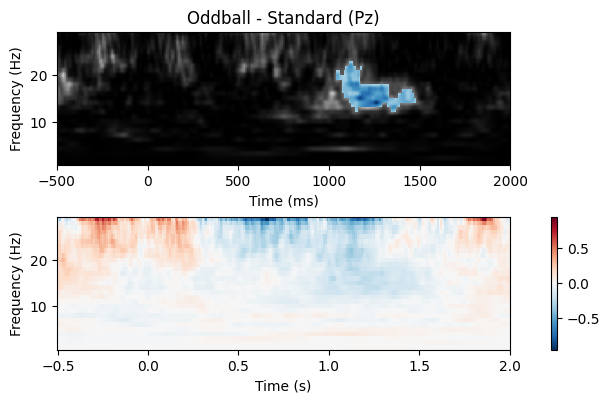

In [32]:
if subj_list == ['013'] or subj_list == ['014'] or subj_list == ['015']:
    ch_picks =['Fz','FC2','FC6','Cz','C4','CP2','CP6','Pz']
else:
    ch_picks =['FC6','FC2','Fz','Cz','C4','CP6','CP2','Pz']



for ch_name in ch_picks:
    
    epochs_power_1 = tfrs[1].copy().crop(-0.5,2).pick(ch_name).data[:, 0, :, :]  # only 1 channel as 3D matrix
    epochs_power_2 = tfrs[0].copy().crop(-0.5,2).pick(ch_name).data[:, 0, :, :]  # only 1 channel as 3D matrix
    
    p_threshold = 0.01
    n_epochs = epochs_power_1.shape[0]
    stat_fun = partial(mne.stats.ttest_ind_no_p, sigma=1e-3)
    t_threshold = -stats.distributions.t.ppf(p_threshold / 2., n_epochs - 1)

    t_obs, clusters, cluster_p_values, H0 = permutation_cluster_test(
        [epochs_power_1, epochs_power_2],
        out_type="mask",
        n_permutations=5000,
        threshold=6,
        tail=0,
        seed=np.random.default_rng(seed=8675309),
    )
        
    times = 1e3 * tfrs[0].copy().crop(-0.5,2).times  # change unit to ms
    
    fig, (ax, ax2) = plt.subplots(2, 1, figsize=(6, 4), layout="constrained")
    
    # Compute the difference in evoked to determine which was greater since
    # we used a 1-way ANOVA which tested for a difference in population means
    evoked_power_1 = epochs_power_1.mean(axis=0)
    evoked_power_2 = epochs_power_2.mean(axis=0)
    evoked_power_contrast = evoked_power_1 - evoked_power_2
    signs = np.sign(evoked_power_contrast)
    
    # Create new stats image with only significant clusters
    t_obs_plot = np.nan * np.ones_like(t_obs)
    for c, p_val in zip(clusters, cluster_p_values):
        if p_val <= 0.05:
            t_obs_plot[c] = t_obs[c] * signs[c]
    
    ax.imshow(
        t_obs,
        extent=[times[0], times[-1], freqs[0], freqs[-1]],
        aspect="auto",
        origin="lower",
        cmap="gray",
    )
    max_t = np.nanmax(abs(t_obs_plot))
    ax.imshow(
        t_obs_plot,
        extent=[times[0], times[-1], freqs[0], freqs[-1]],
        aspect="auto",
        origin="lower",
        cmap="RdBu_r",
        vmin=-max_t,
        vmax=max_t,
    )
    
    ax.set_xlabel("Time (ms)")
    ax.set_ylabel("Frequency (Hz)")
    ax.set_title(f"Oddball - Standard ({ch_name})")
    
    # plot evoked
    evoked_condition_1 = tfrs[1].copy().crop(-0.5,2).pick(ch_name).average()
    evoked_condition_2 = tfrs[0].copy().crop(-0.5,2).pick(ch_name).average()
    evoked_contrast = mne.combine_evoked(
        [evoked_condition_1, evoked_condition_2], weights=[1, -1]
    )
    evoked_contrast.plot(axes=ax2)

stat_fun(H1): min=0.000000 max=18.869387
Running initial clustering …
Found 55 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


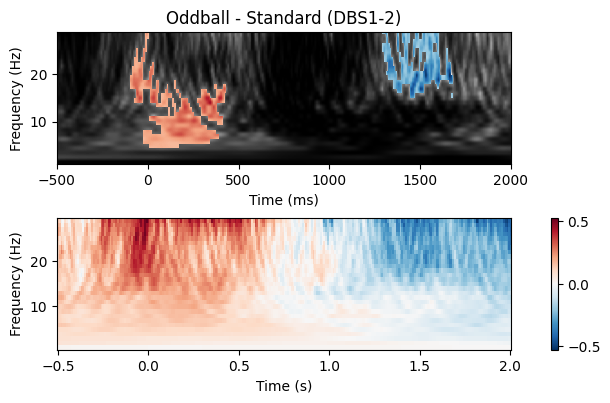

stat_fun(H1): min=0.000000 max=10.178341
Running initial clustering …
Found 12 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


/tmp/ipykernel_304516/776716809.py:47: RuntimeWarning: All-NaN slice encountered
  max_t = np.nanmax(abs(t_obs_plot))


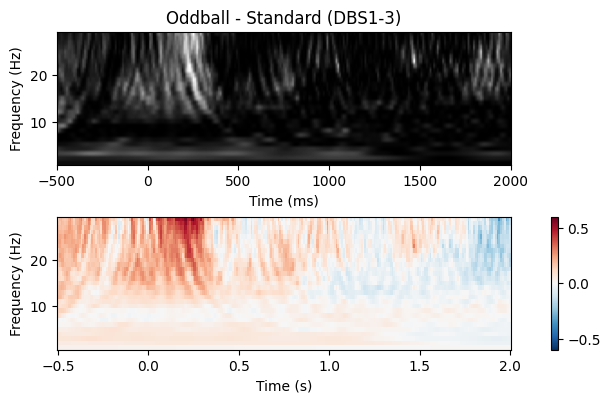

stat_fun(H1): min=0.000000 max=11.049243
Running initial clustering …
Found 15 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


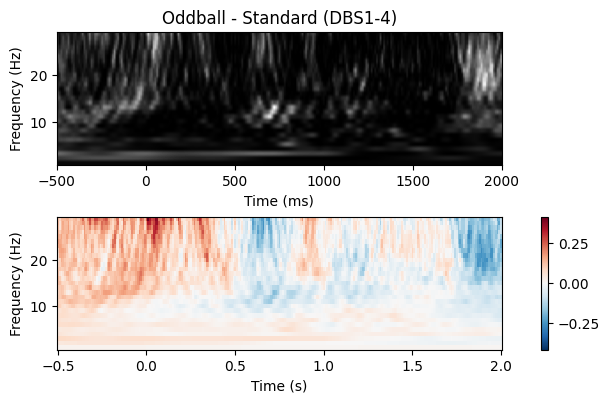

stat_fun(H1): min=0.000000 max=24.822209
Running initial clustering …
Found 28 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


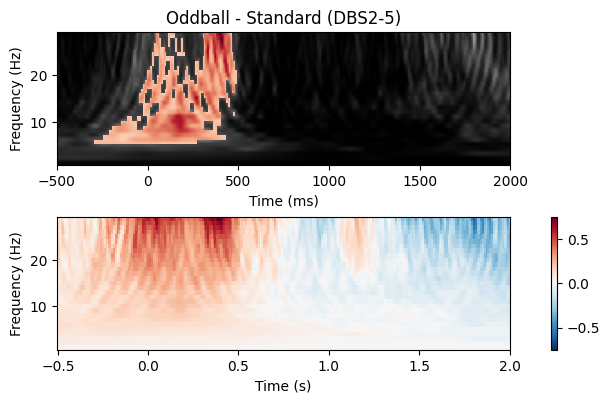

stat_fun(H1): min=0.000000 max=8.926113
Running initial clustering …
Found 18 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


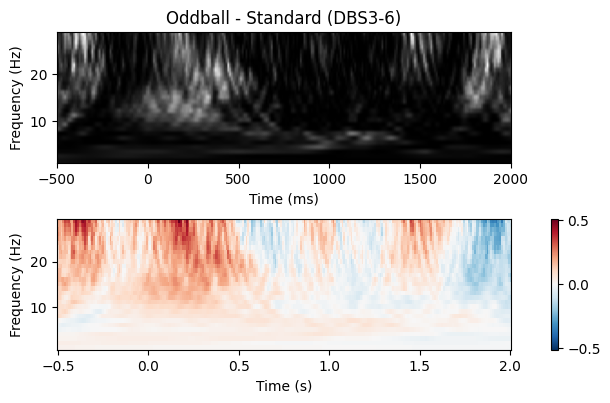

stat_fun(H1): min=0.000000 max=10.222277
Running initial clustering …
Found 19 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


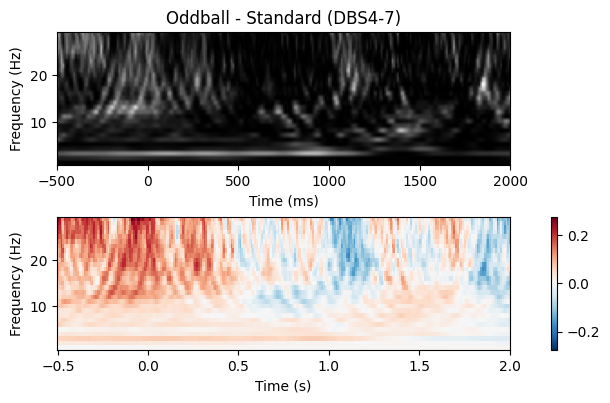

stat_fun(H1): min=0.000000 max=17.483230
Running initial clustering …
Found 27 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


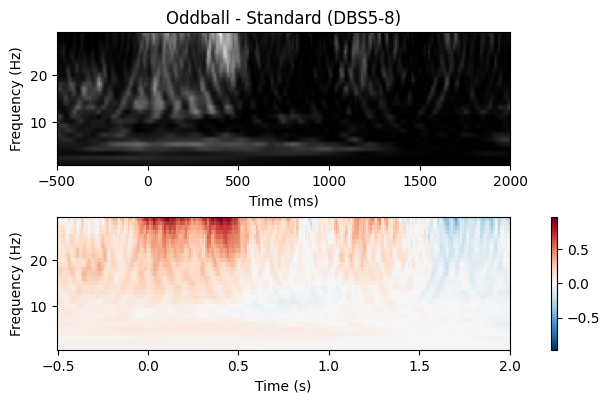

stat_fun(H1): min=0.000000 max=16.634579
Running initial clustering …
Found 27 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


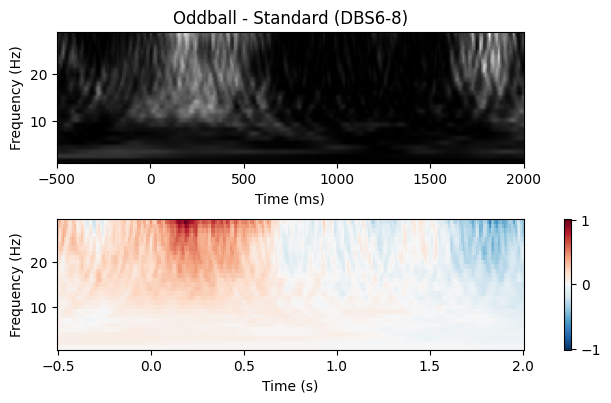

stat_fun(H1): min=0.000000 max=10.421940
Running initial clustering …
Found 18 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


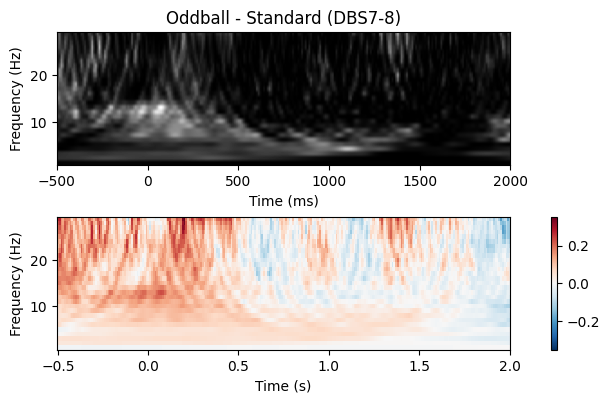

In [11]:
ch_names =tfrs_dbs[0].info.ch_names
from functools import partial

for ch_name in ch_names:
    
    epochs_power_1 = tfrs_dbs[1].copy().crop(-0.5,2).pick(ch_name).data[:, 0, :, :]  # only 1 channel as 3D matrix
    epochs_power_2 = tfrs_dbs[0].copy().crop(-0.5,2).pick(ch_name).data[:, 0, :, :]  # only 1 channel as 3D matrix
    
    p_threshold = 0.01
    n_epochs = epochs_power_1.shape[0]
    stat_fun = partial(mne.stats.ttest_ind_no_p, sigma=1e-3)
    t_threshold = -stats.distributions.t.ppf(p_threshold / 2., n_epochs - 1)

    t_obs, clusters, cluster_p_values, H0 = permutation_cluster_test(
        [epochs_power_1, epochs_power_2],
        out_type="mask",
        n_permutations=5000,
        threshold=6,
        tail=0,
        seed=np.random.default_rng(seed=8675309),
    )
        
    times = 1e3 * tfrs_dbs[0].copy().crop(-0.5,2).times  # change unit to ms
    
    fig, (ax, ax2) = plt.subplots(2, 1, figsize=(6, 4), layout="constrained")
    
    # Compute the difference in evoked to determine which was greater since
    # we used a 1-way ANOVA which tested for a difference in population means
    evoked_power_1 = epochs_power_1.mean(axis=0)
    evoked_power_2 = epochs_power_2.mean(axis=0)
    evoked_power_contrast = evoked_power_1 - evoked_power_2
    signs = np.sign(evoked_power_contrast)
    
    # Create new stats image with only significant clusters
    t_obs_plot = np.nan * np.ones_like(t_obs)
    for c, p_val in zip(clusters, cluster_p_values):
        if p_val <= 0.05:
            t_obs_plot[c] = t_obs[c] * signs[c]
    
    ax.imshow(
        t_obs,
        extent=[times[0], times[-1], freqs[0], freqs[-1]],
        aspect="auto",
        origin="lower",
        cmap="gray",
    )
    max_t = np.nanmax(abs(t_obs_plot))
    ax.imshow(
        t_obs_plot,
        extent=[times[0], times[-1], freqs[0], freqs[-1]],
        aspect="auto",
        origin="lower",
        cmap="RdBu_r",
        vmin=-max_t,
        vmax=max_t,
    )
    
    ax.set_xlabel("Time (ms)")
    ax.set_ylabel("Frequency (Hz)")
    ax.set_title(f"Oddball - Standard ({ch_name})")
    
    # plot evoked
    evoked_condition_1 = tfrs_dbs[1].copy().crop(-0.5,2).pick(ch_name).average()
    evoked_condition_2 = tfrs_dbs[0].copy().crop(-0.5,2).pick(ch_name).average()
    evoked_contrast = mne.combine_evoked(
        [evoked_condition_1, evoked_condition_2], weights=[1, -1]
    )
    evoked_contrast.plot(axes=ax2)

In [168]:
epochs_aff_odd1.get_data()

array([[[-7.21204989e-01,  1.52608770e+00,  2.87227522e+00, ...,
         -4.55911005e+00, -3.89563999e+00, -2.22920609e+00],
        [ 7.13955019e-01,  6.76869949e+00,  1.07232717e+01, ...,
         -5.10349239e+00, -5.50095906e+00, -4.03523965e+00],
        [ 1.08156990e+01,  2.76814055e+00, -4.93965223e+00, ...,
         -4.87517311e+00, -4.77654524e+00, -5.42064101e+00],
        ...,
        [-9.65695370e-01, -6.34345457e-01, -9.63733982e-01, ...,
         -7.47457009e-01, -8.95969809e-01, -5.80188055e-01],
        [ 3.62711548e-01, -3.53889043e-01,  5.75959689e-01, ...,
          9.19910118e-01, -8.31251897e-01,  4.07218797e-01],
        [ 1.07538636e-01, -4.26577119e-01,  2.94332610e-01, ...,
         -1.99098670e-01, -3.61037728e-01, -6.06591049e-02]],

       [[-8.76038251e-01,  1.12254458e+00,  2.55326647e+00, ...,
         -9.52189469e-01, -5.25704828e-01, -1.20035321e+00],
        [ 2.31442792e-02,  7.30297719e+00,  1.25276632e+01, ...,
         -9.88082179e-01, -6.67664022e

Coherence 

In [169]:
"""Average Baseline"""
epochs_aff_odd_norm1 =[] 
for ii,ch in enumerate(epochs_aff_odd.ch_names):
    x = np.hstack(epochs_aff_odd.get_data()[:, ii, :]) # 2D dim = epoch* ch* time to 1D dim, freq * (time *epoch)

    x_mean=x.mean() # mean of all the freqs across all the complete experiment session.
    epochs_aff_odd_norm=[]    
    for jj in range(epochs_aff_odd.get_data()[:, ii, :].shape[0]):
        epochs_aff_odd_norm.append(((epochs_aff_odd.get_data()[jj, ii, :]-x_mean)/x_mean)) # applying normalaization on each trail
    epochs_aff_odd_norm1.append(epochs_aff_odd_norm)
epochs_aff_odd_norm1 = np.array(epochs_aff_odd_norm1)
epochs_aff_odd_norm1 = np.rollaxis(epochs_aff_odd_norm1,1) # normalized epoch data

epochs_aff_odd1 = mne.EpochsArray(epochs_aff_odd_norm1,  epochs_aff_odd.info, events=epochs_aff_odd.events, tmin=epochs_aff_odd.tmin)

""""Coherence"""

picks = mne.pick_types(epochs_aff_odd1.info, eeg=True, dbs=True, emg= False,stim=False, eog=False,
                       exclude='bads')

epochs_aff_odd1.pick(['eeg','dbs'])
epochs_aff_typ.pick(['eeg','dbs'])

# Use 'DBS' channels as seed
        
seed_chs = epochs_aff_odd1.copy().pick('dbs').ch_names

for seed_ch in seed_chs:
    
    picks_ch_names = [epochs_aff_odd1.ch_names[i-2] for i in picks]

    # Create seed-target indices for connectivity computation
    seed = picks_ch_names.index(seed_ch)
    targets = np.arange(len(picks))
    indices = seed_target_indices(seed, targets)

    # Define wavelet frequencies and number of cycles
    cwt_freqs = np.arange(1, 41, 1)
    cwt_n_cycles = 7

    # Run the connectivity analysis using 2 parallel jobs
    con_odd = spectral_connectivity_epochs(
        epochs_aff_odd1, indices=indices,
        method='coh', mode='cwt_morlet', sfreq=sfreq,
        cwt_freqs=cwt_freqs, cwt_n_cycles=cwt_n_cycles, n_jobs=1)

    con_typ = spectral_connectivity_epochs(
        epochs_aff_typ, indices=indices,
        method='coh', mode='cwt_morlet', sfreq=sfreq,
        cwt_freqs=cwt_freqs, cwt_n_cycles=cwt_n_cycles, n_jobs=1)

    times = con_odd.times
    freqs = con_odd.freqs

    # Mark the seed channel with a value of 1.0, so we can see it in the plot
    con_odd.get_data()[np.where(indices[1] == seed)] = 1.0
    con_typ.get_data()[np.where(indices[1] == seed)] = 1.0

    #layout = mne.find_layout(epochs.info, 'eeg')  # use full layout
    tfr_odd = mne.time_frequency.AverageTFR(epochs_aff_odd1.info, con_odd.get_data(), times, freqs, len(epochs_aff_odd1))
    tfr_odd.save(result_dir+'tfr_odd'+st+seed_ch+'-tfr.h5',overwrite =True)

    tfr_typ = mne.time_frequency.AverageTFR(epochs_aff_typ.info, con_typ.get_data(), times, freqs, len(epochs_aff_typ))
    tfr_typ.save(result_dir+'tfr_typ'+st+seed_ch+'-tfr.h5',overwrite =True)


Not setting metadata
52 matching events found
No baseline correction applied
0 projection items activated
Connectivity computation...
    computing connectivity for 42 connections
    using t=-3.000s..6.000s for estimation (1801 points)
    frequencies: 1.0Hz..40.0Hz (40 points)
    using CWT with Morlet wavelets to estimate spectra
    the following metrics will be computed: Coherence
    computing connectivity for epoch 1


/tmp/ipykernel_4150852/2221692851.py:42: RuntimeWarning: There were no Annotations stored in <EpochsArray |  52 events (all good), -3 – 6 s, baseline off, ~30.1 MB, data loaded,
 '101': 52>, so metadata was not modified.
  con_odd = spectral_connectivity_epochs(
/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 2


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 3


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 4


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 5


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 6


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 7


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 8


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 9


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 10


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 11


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 12


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 13


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 14


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 15


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 16


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 17


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 18


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 19


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 20


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 21


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 22


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 23


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 24


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 25


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 26


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 27


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 28


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 29


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 30


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 31


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 32


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 33


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 34


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 35


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 36


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 37


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 38


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 39


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 40


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 41


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 42


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 43


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 44


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 45


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 46


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 47


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 48


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 49


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 50


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 51


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 52


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


[Connectivity computation done]
Connectivity computation...
    computing connectivity for 42 connections
    using t=-3.000s..6.000s for estimation (1801 points)
    frequencies: 1.0Hz..40.0Hz (40 points)
    using CWT with Morlet wavelets to estimate spectra
    the following metrics will be computed: Coherence
    computing connectivity for epoch 1


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 2


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 3


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 4


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 5


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 6


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 7


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 8


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 9


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 10


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 11


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 12


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 13


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 14


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 15


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 16


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 17


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 18


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 19


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 20


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 21


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 22


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 23


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 24


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 25


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 26


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 27


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 28


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 29


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 30


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 31


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 32


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 33


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 34


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 35


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 36


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 37


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 38


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 39


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 40


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 41


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 42


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 43


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 44


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 45


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 46


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 47


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 48


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 49


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 50


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 51


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 52


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


[Connectivity computation done]
Connectivity computation...
    computing connectivity for 42 connections
    using t=-3.000s..6.000s for estimation (1801 points)
    frequencies: 1.0Hz..40.0Hz (40 points)
    using CWT with Morlet wavelets to estimate spectra
    the following metrics will be computed: Coherence
    computing connectivity for epoch 1


/tmp/ipykernel_4150852/2221692851.py:42: RuntimeWarning: There were no Annotations stored in <EpochsArray |  52 events (all good), -3 – 6 s, baseline off, ~30.1 MB, data loaded,
 '101': 52>, so metadata was not modified.
  con_odd = spectral_connectivity_epochs(
/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 2


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 3


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 4


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 5


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 6


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 7


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 8


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 9


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 10


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 11


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 12


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 13


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 14


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 15


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 16


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 17


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 18


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 19


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 20


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 21


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 22


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 23


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 24


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 25


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 26


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 27


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 28


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 29


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 30


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 31


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 32


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 33


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 34


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 35


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 36


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 37


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 38


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 39


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 40


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 41


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 42


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 43


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 44


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 45


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 46


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 47


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 48


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 49


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 50


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 51


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 52


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


[Connectivity computation done]
Connectivity computation...
    computing connectivity for 42 connections
    using t=-3.000s..6.000s for estimation (1801 points)
    frequencies: 1.0Hz..40.0Hz (40 points)
    using CWT with Morlet wavelets to estimate spectra
    the following metrics will be computed: Coherence
    computing connectivity for epoch 1


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 2


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 3


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 4


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 5


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 6


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 7


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 8


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 9


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 10


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 11


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 12


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 13


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 14


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 15


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 16


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 17


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 18


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 19


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 20


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 21


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 22


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 23


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 24


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 25


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 26


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 27


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 28


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 29


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 30


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 31


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 32


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 33


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 34


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 35


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 36


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 37


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 38


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 39


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 40


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 41


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 42


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 43


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 44


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 45


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 46


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 47


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 48


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 49


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 50


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 51


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 52


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


[Connectivity computation done]
Connectivity computation...
    computing connectivity for 42 connections
    using t=-3.000s..6.000s for estimation (1801 points)
    frequencies: 1.0Hz..40.0Hz (40 points)
    using CWT with Morlet wavelets to estimate spectra
    the following metrics will be computed: Coherence
    computing connectivity for epoch 1


/tmp/ipykernel_4150852/2221692851.py:42: RuntimeWarning: There were no Annotations stored in <EpochsArray |  52 events (all good), -3 – 6 s, baseline off, ~30.1 MB, data loaded,
 '101': 52>, so metadata was not modified.
  con_odd = spectral_connectivity_epochs(
/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 2


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 3


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 4


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 5


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 6


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 7


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 8


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 9


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 10


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 11


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 12


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 13


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 14


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 15


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 16


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 17


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 18


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 19


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 20


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 21


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 22


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 23


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 24


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 25


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 26


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 27


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 28


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 29


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 30


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 31


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 32


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 33


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 34


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 35


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 36


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 37


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 38


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 39


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 40


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 41


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 42


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 43


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 44


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 45


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 46


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 47


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 48


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 49


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 50


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 51


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 52


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


[Connectivity computation done]
Connectivity computation...
    computing connectivity for 42 connections
    using t=-3.000s..6.000s for estimation (1801 points)
    frequencies: 1.0Hz..40.0Hz (40 points)
    using CWT with Morlet wavelets to estimate spectra
    the following metrics will be computed: Coherence
    computing connectivity for epoch 1


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 2


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 3


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 4


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 5


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 6


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 7


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 8


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 9


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 10


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 11


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 12


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 13


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 14


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 15


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 16


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 17


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 18


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 19


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 20


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 21


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 22


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 23


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 24


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 25


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 26


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 27


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 28


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 29


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 30


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 31


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 32


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 33


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 34


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 35


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 36


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 37


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 38


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 39


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 40


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 41


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 42


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 43


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 44


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 45


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 46


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 47


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 48


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 49


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 50


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 51


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 52


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


[Connectivity computation done]
Connectivity computation...
    computing connectivity for 42 connections
    using t=-3.000s..6.000s for estimation (1801 points)
    frequencies: 1.0Hz..40.0Hz (40 points)
    using CWT with Morlet wavelets to estimate spectra
    the following metrics will be computed: Coherence
    computing connectivity for epoch 1


/tmp/ipykernel_4150852/2221692851.py:42: RuntimeWarning: There were no Annotations stored in <EpochsArray |  52 events (all good), -3 – 6 s, baseline off, ~30.1 MB, data loaded,
 '101': 52>, so metadata was not modified.
  con_odd = spectral_connectivity_epochs(
/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 2


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 3


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 4


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 5


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 6


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 7


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 8


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 9


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 10


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 11


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 12


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 13


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 14


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 15


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 16


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 17


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 18


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 19


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 20


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 21


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 22


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 23


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 24


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 25


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 26


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 27


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 28


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 29


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 30


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 31


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 32


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 33


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 34


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 35


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 36


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 37


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 38


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 39


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 40


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 41


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 42


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 43


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 44


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 45


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 46


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 47


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 48


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 49


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 50


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 51


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 52


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


[Connectivity computation done]
Connectivity computation...
    computing connectivity for 42 connections
    using t=-3.000s..6.000s for estimation (1801 points)
    frequencies: 1.0Hz..40.0Hz (40 points)
    using CWT with Morlet wavelets to estimate spectra
    the following metrics will be computed: Coherence
    computing connectivity for epoch 1


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 2


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 3


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 4


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 5


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 6


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 7


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 8


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 9


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 10


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 11


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 12


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 13


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 14


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 15


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 16


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 17


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 18


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 19


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 20


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 21


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 22


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 23


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 24


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 25


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 26


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 27


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 28


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 29


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 30


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 31


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 32


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 33


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 34


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 35


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 36


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 37


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 38


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 39


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 40


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 41


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 42


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 43


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 44


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 45


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 46


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 47


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 48


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 49


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 50


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 51


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 52


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


[Connectivity computation done]
Connectivity computation...
    computing connectivity for 42 connections
    using t=-3.000s..6.000s for estimation (1801 points)
    frequencies: 1.0Hz..40.0Hz (40 points)
    using CWT with Morlet wavelets to estimate spectra
    the following metrics will be computed: Coherence
    computing connectivity for epoch 1


/tmp/ipykernel_4150852/2221692851.py:42: RuntimeWarning: There were no Annotations stored in <EpochsArray |  52 events (all good), -3 – 6 s, baseline off, ~30.1 MB, data loaded,
 '101': 52>, so metadata was not modified.
  con_odd = spectral_connectivity_epochs(
/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 2


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 3


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 4


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 5


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 6


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 7


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 8


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 9


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 10


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 11


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 12


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 13


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 14


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 15


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 16


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 17


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 18


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 19


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 20


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 21


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 22


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 23


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 24


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 25


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 26


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 27


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 28


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 29


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 30


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 31


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 32


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 33


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 34


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 35


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 36


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 37


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 38


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 39


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 40


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 41


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 42


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 43


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 44


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 45


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 46


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 47


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 48


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 49


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 50


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 51


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 52


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


[Connectivity computation done]
Connectivity computation...
    computing connectivity for 42 connections
    using t=-3.000s..6.000s for estimation (1801 points)
    frequencies: 1.0Hz..40.0Hz (40 points)
    using CWT with Morlet wavelets to estimate spectra
    the following metrics will be computed: Coherence
    computing connectivity for epoch 1


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 2


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 3


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 4


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 5


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 6


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 7


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 8


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 9


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 10


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 11


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 12


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 13


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 14


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 15


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 16


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 17


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 18


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 19


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 20


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 21


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 22


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 23


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 24


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 25


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 26


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 27


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 28


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 29


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 30


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 31


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 32


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 33


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 34


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 35


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 36


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 37


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 38


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 39


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 40


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 41


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 42


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 43


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 44


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 45


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 46


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 47


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 48


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 49


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 50


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 51


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 52


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


[Connectivity computation done]
Connectivity computation...
    computing connectivity for 42 connections
    using t=-3.000s..6.000s for estimation (1801 points)
    frequencies: 1.0Hz..40.0Hz (40 points)
    using CWT with Morlet wavelets to estimate spectra
    the following metrics will be computed: Coherence
    computing connectivity for epoch 1


/tmp/ipykernel_4150852/2221692851.py:42: RuntimeWarning: There were no Annotations stored in <EpochsArray |  52 events (all good), -3 – 6 s, baseline off, ~30.1 MB, data loaded,
 '101': 52>, so metadata was not modified.
  con_odd = spectral_connectivity_epochs(
/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 2


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 3


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 4


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 5


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 6


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 7


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 8


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 9


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 10


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 11


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 12


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 13


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 14


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 15


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 16


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 17


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 18


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 19


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 20


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 21


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 22


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 23


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 24


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 25


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 26


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 27


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 28


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 29


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 30


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 31


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 32


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 33


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 34


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 35


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 36


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 37


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 38


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 39


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 40


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 41


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 42


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 43


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 44


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 45


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 46


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 47


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 48


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 49


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 50


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 51


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 52


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


[Connectivity computation done]
Connectivity computation...
    computing connectivity for 42 connections
    using t=-3.000s..6.000s for estimation (1801 points)
    frequencies: 1.0Hz..40.0Hz (40 points)
    using CWT with Morlet wavelets to estimate spectra
    the following metrics will be computed: Coherence
    computing connectivity for epoch 1


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 2


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 3


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 4


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 5


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 6


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 7


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 8


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 9


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 10


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 11


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 12


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 13


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 14


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 15


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 16


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 17


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 18


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 19


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 20


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 21


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 22


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 23


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 24


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 25


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 26


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 27


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 28


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 29


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 30


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 31


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 32


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 33


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 34


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 35


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 36


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 37


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 38


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 39


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 40


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 41


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 42


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 43


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 44


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 45


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 46


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 47


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 48


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 49


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 50


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 51


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 52


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


[Connectivity computation done]
Connectivity computation...
    computing connectivity for 42 connections
    using t=-3.000s..6.000s for estimation (1801 points)
    frequencies: 1.0Hz..40.0Hz (40 points)
    using CWT with Morlet wavelets to estimate spectra
    the following metrics will be computed: Coherence
    computing connectivity for epoch 1


/tmp/ipykernel_4150852/2221692851.py:42: RuntimeWarning: There were no Annotations stored in <EpochsArray |  52 events (all good), -3 – 6 s, baseline off, ~30.1 MB, data loaded,
 '101': 52>, so metadata was not modified.
  con_odd = spectral_connectivity_epochs(
/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 2


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 3


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 4


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 5


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 6


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 7


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 8


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 9


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 10


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 11


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 12


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 13


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 14


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 15


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 16


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 17


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 18


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 19


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 20


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 21


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 22


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 23


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 24


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 25


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 26


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 27


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 28


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 29


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 30


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 31


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 32


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 33


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 34


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 35


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 36


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 37


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 38


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 39


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 40


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 41


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 42


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 43


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 44


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 45


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 46


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 47


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 48


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 49


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 50


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 51


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


    computing connectivity for epoch 52


/tmp/ipykernel_4150852/2221692851.py:42: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_odd = spectral_connectivity_epochs(


[Connectivity computation done]
Connectivity computation...
    computing connectivity for 42 connections
    using t=-3.000s..6.000s for estimation (1801 points)
    frequencies: 1.0Hz..40.0Hz (40 points)
    using CWT with Morlet wavelets to estimate spectra
    the following metrics will be computed: Coherence
    computing connectivity for epoch 1


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 2


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 3


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 4


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 5


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 6


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 7


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 8


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 9


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 10


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 11


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 12


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 13


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 14


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 15


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 16


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 17


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 18


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 19


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 20


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 21


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 22


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 23


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 24


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 25


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 26


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 27


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 28


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 29


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 30


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 31


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 32


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 33


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 34


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 35


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 36


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 37


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 38


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 39


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 40


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 41


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 42


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 43


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 44


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 45


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 46


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 47


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 48


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 49


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 50


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 51


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


    computing connectivity for epoch 52


/tmp/ipykernel_4150852/2221692851.py:47: UserWarning: At least one of the wavelets (2229) is longer than the signal (1801). Consider using a longer signal or shorter wavelets.
  con_typ = spectral_connectivity_epochs(


[Connectivity computation done]


Reading /mnt/beegfs/malann/Oddball Data/EDEN015/ANALYSIS/tfr_oddimplantDBS1-2-tfr.h5 ...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


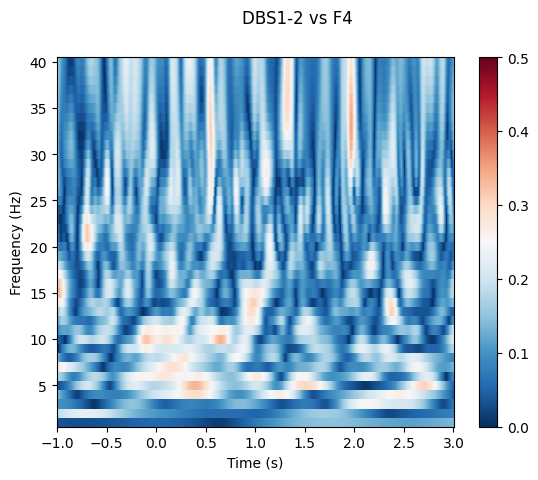

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


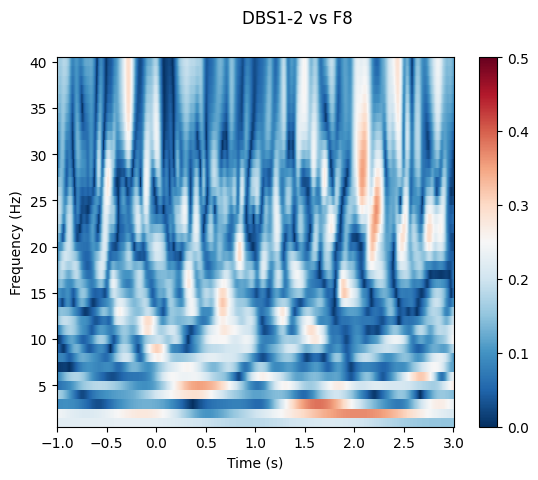

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


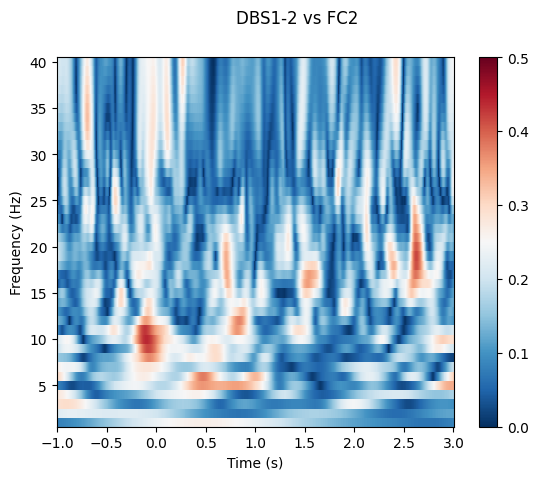

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


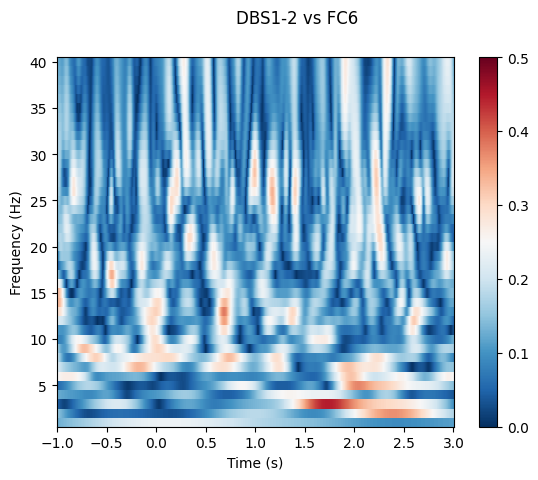

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


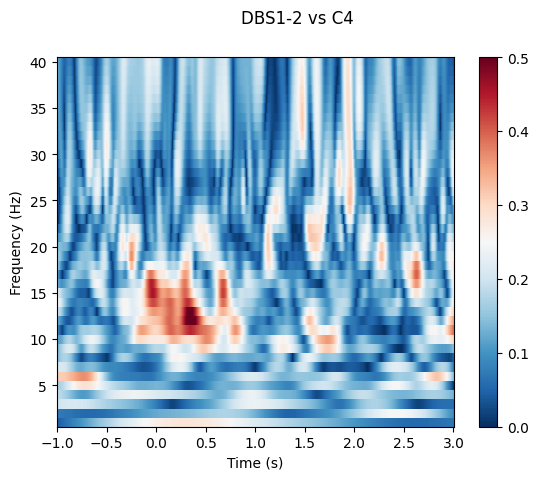

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


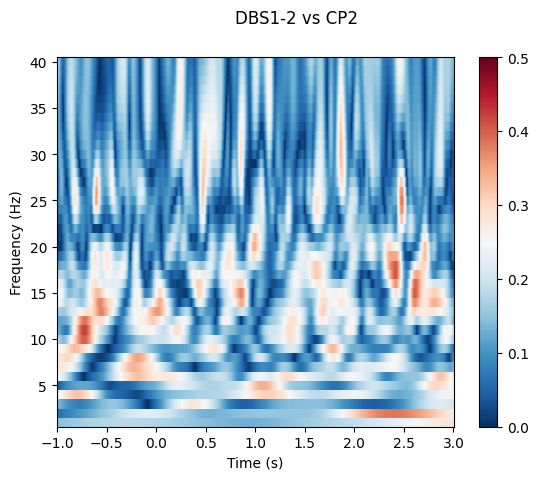

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


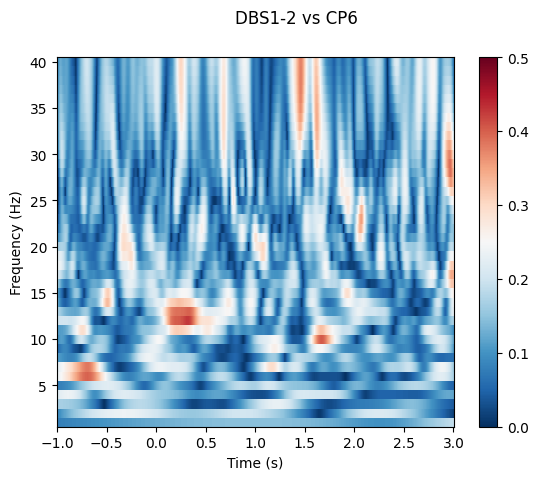

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


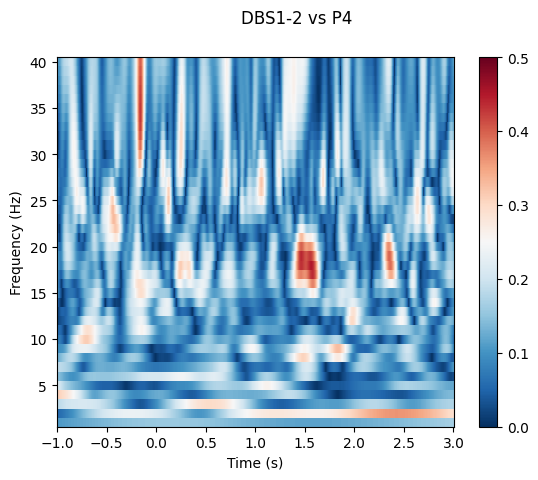

Reading /mnt/beegfs/malann/Oddball Data/EDEN015/ANALYSIS/tfr_oddimplantDBS2-3-tfr.h5 ...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


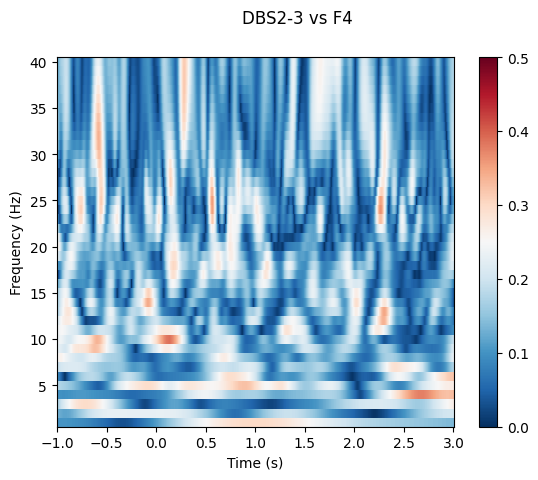

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


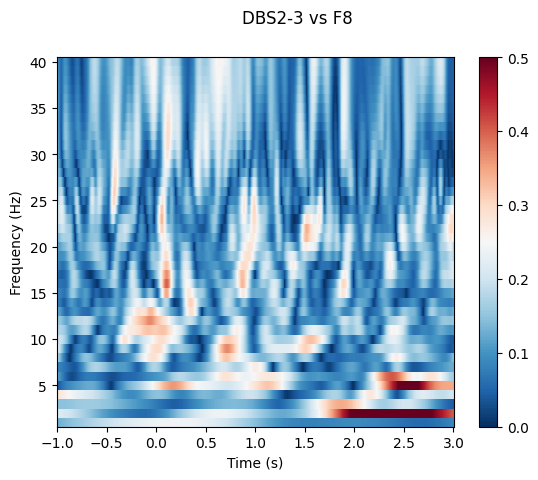

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


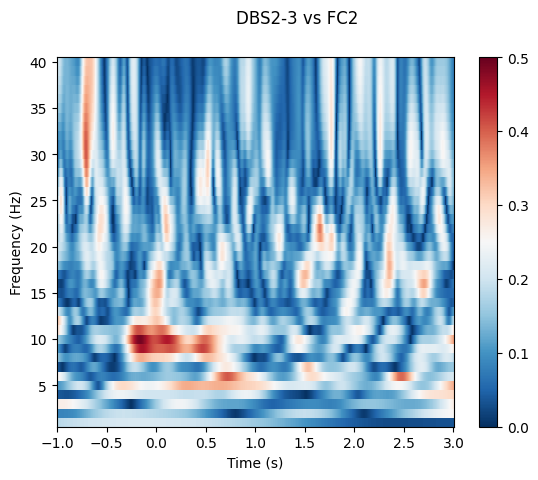

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


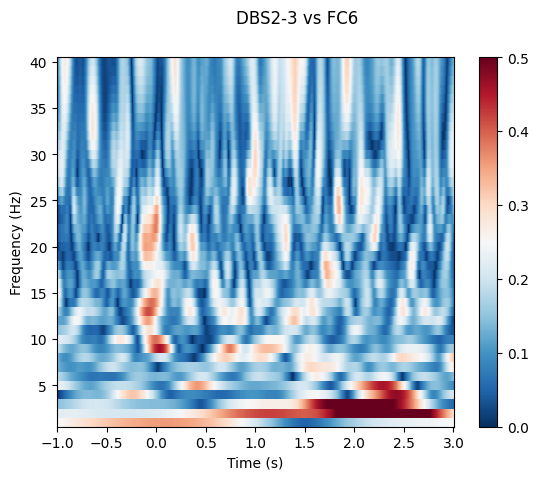

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


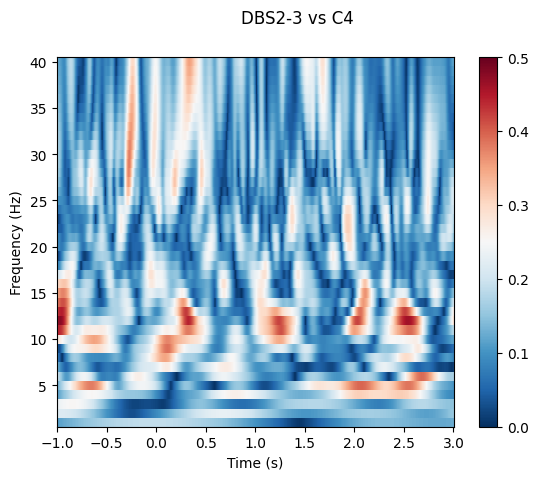

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


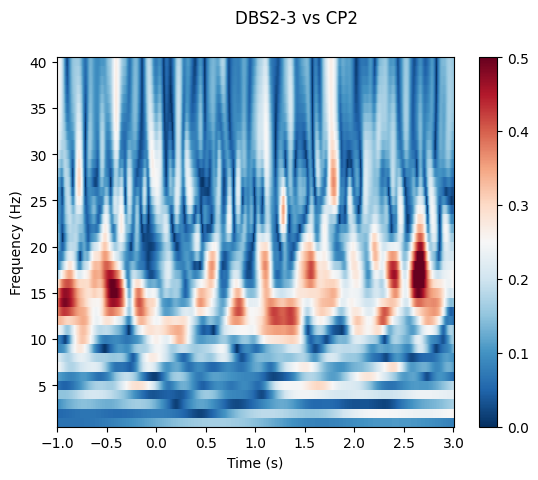

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


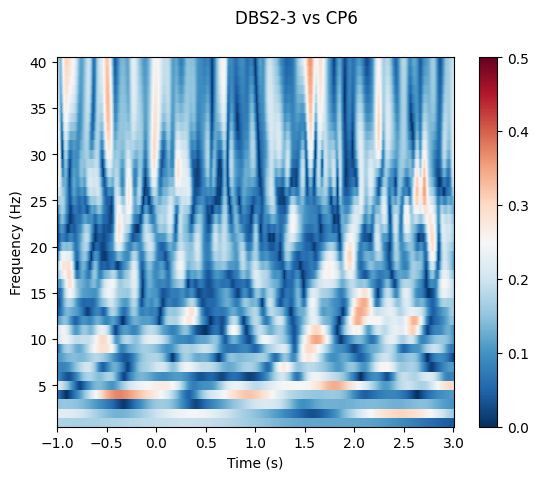

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


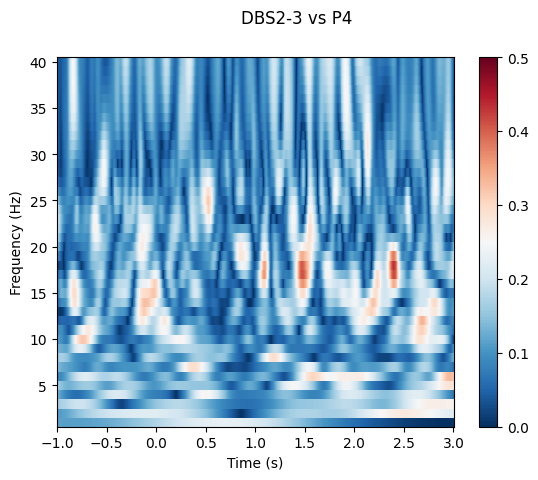

Reading /mnt/beegfs/malann/Oddball Data/EDEN015/ANALYSIS/tfr_oddimplantDBS3-4-tfr.h5 ...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


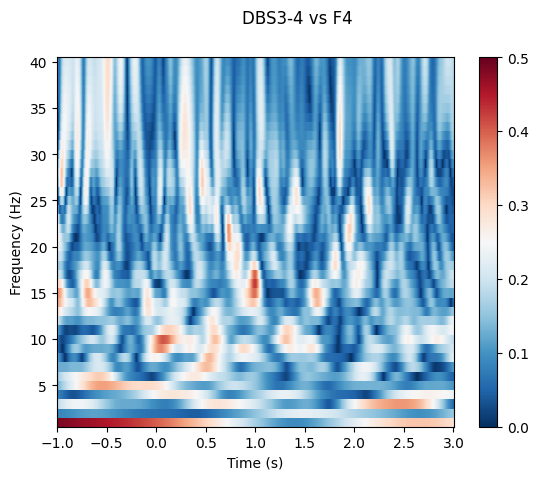

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


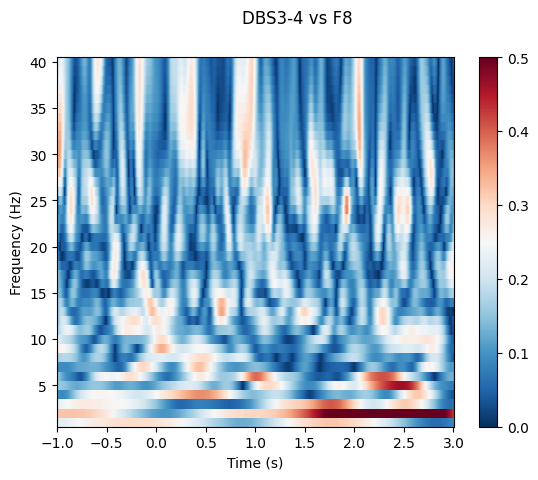

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


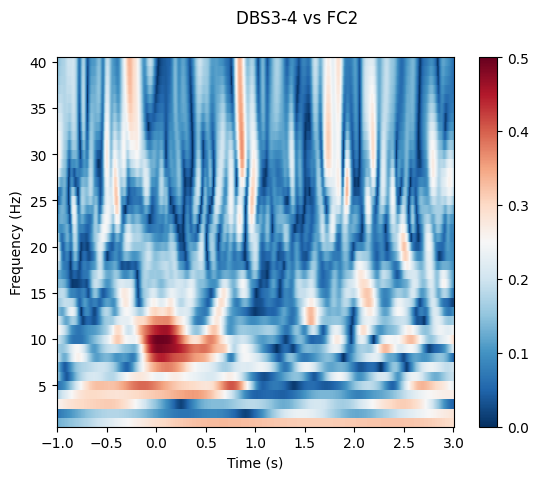

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


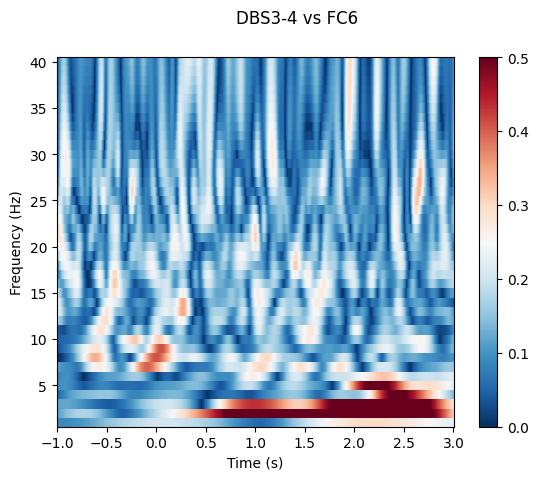

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


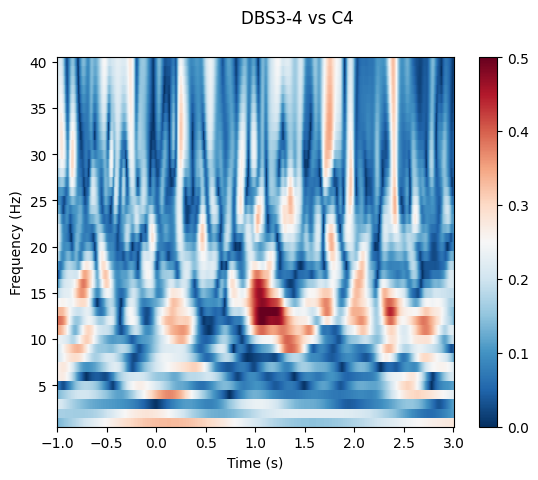

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


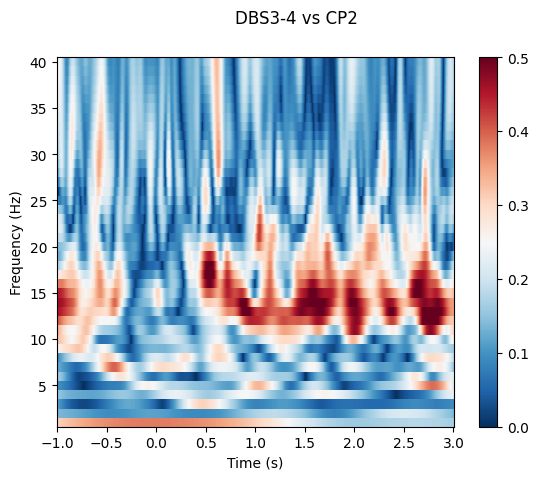

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


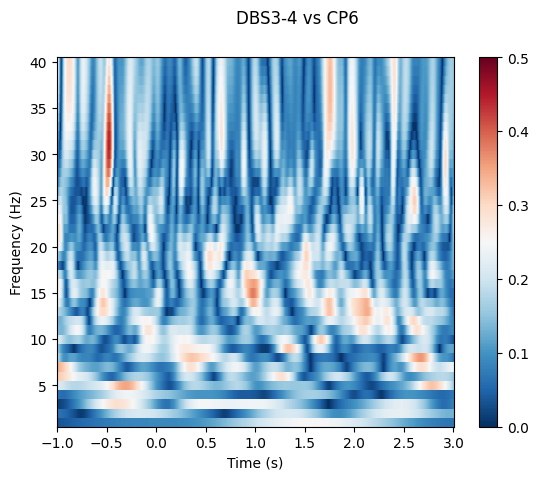

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


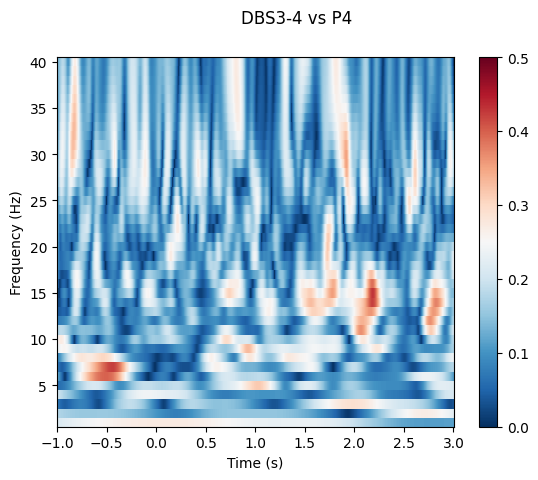

Reading /mnt/beegfs/malann/Oddball Data/EDEN015/ANALYSIS/tfr_oddimplantDBS4-5-tfr.h5 ...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


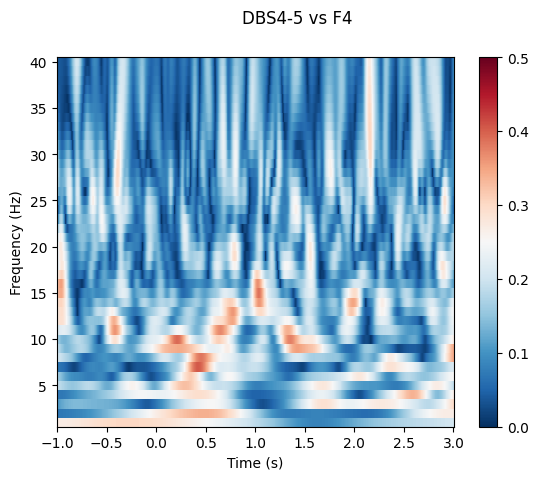

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


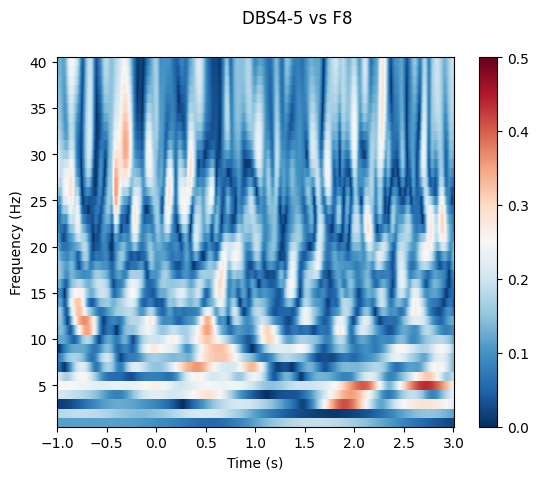

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


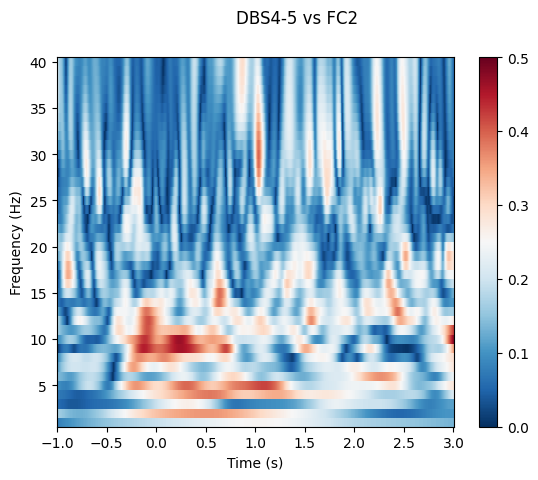

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


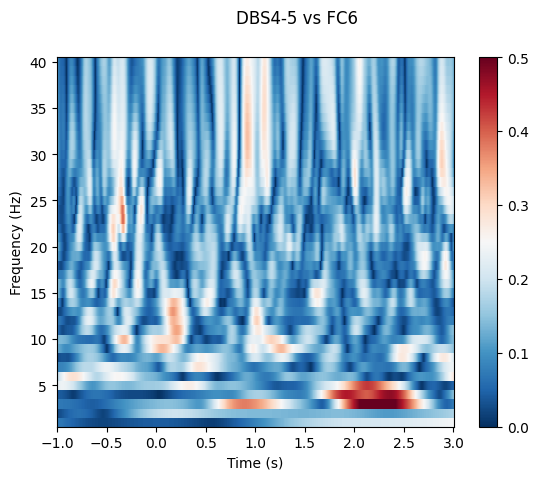

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


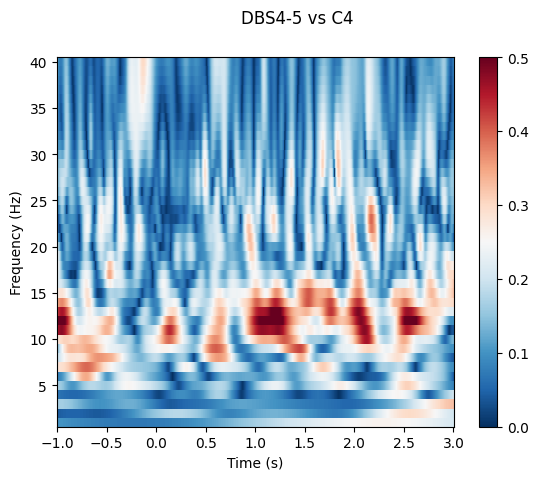

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


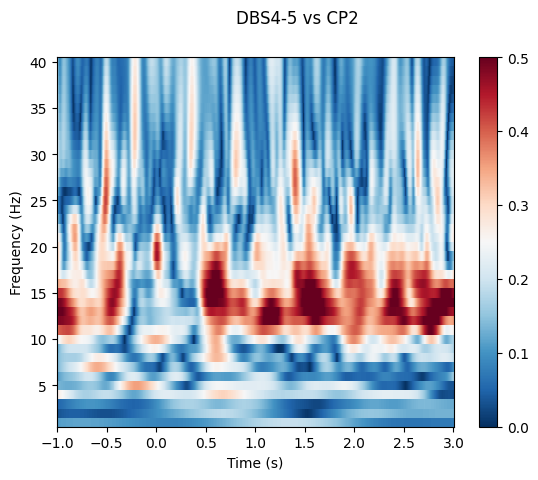

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


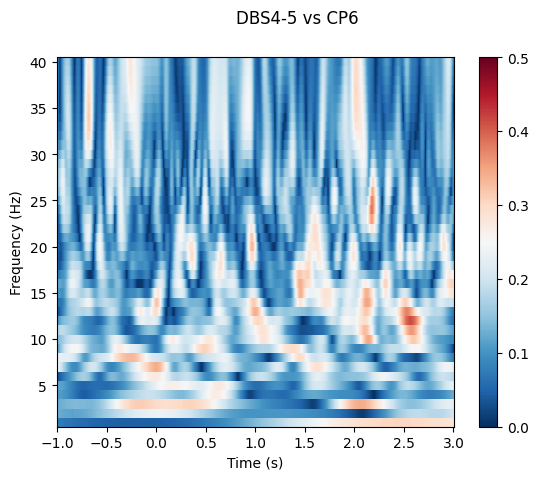

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


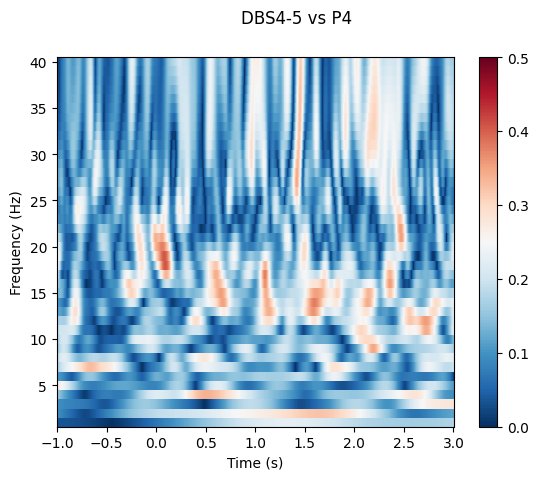

Reading /mnt/beegfs/malann/Oddball Data/EDEN015/ANALYSIS/tfr_oddimplantDBS5-6-tfr.h5 ...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


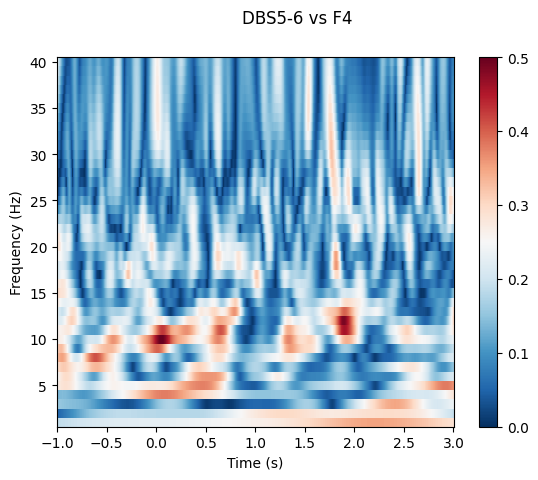

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


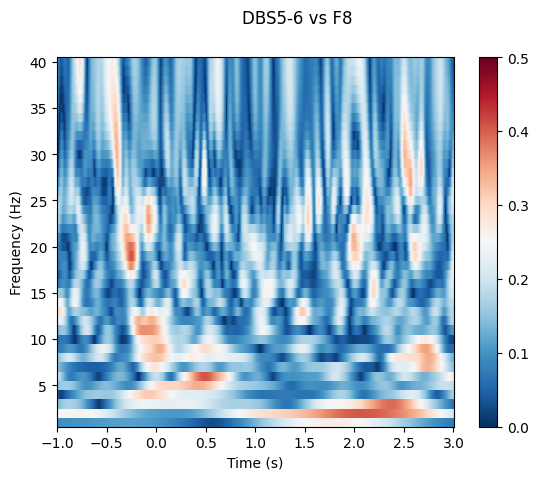

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


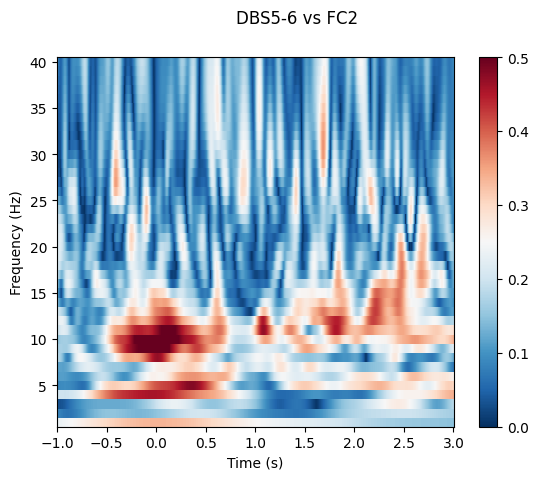

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


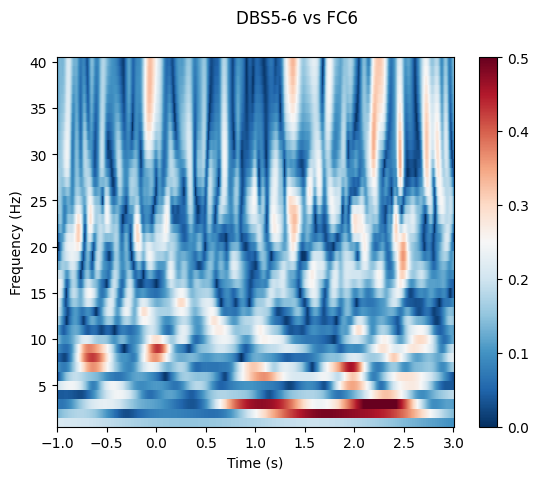

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


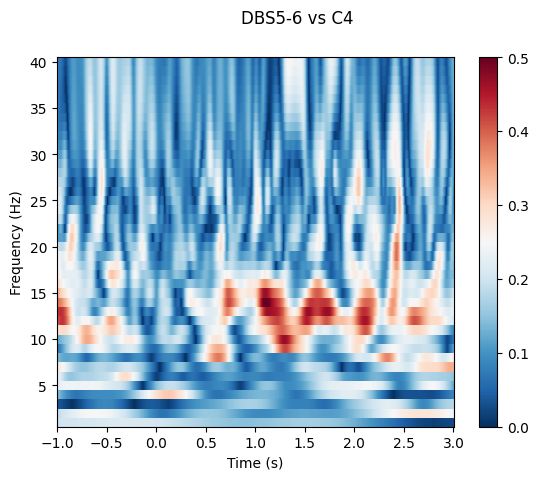

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


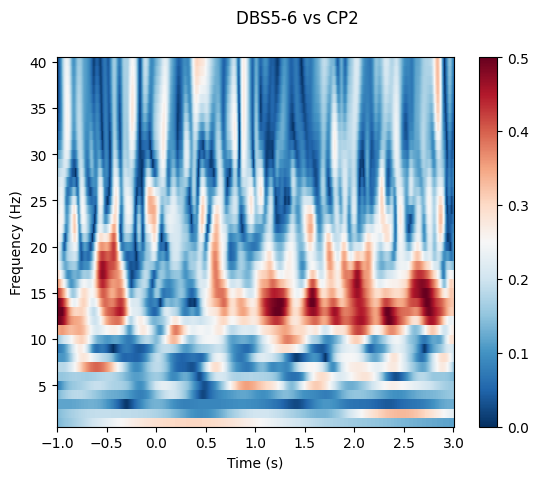

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


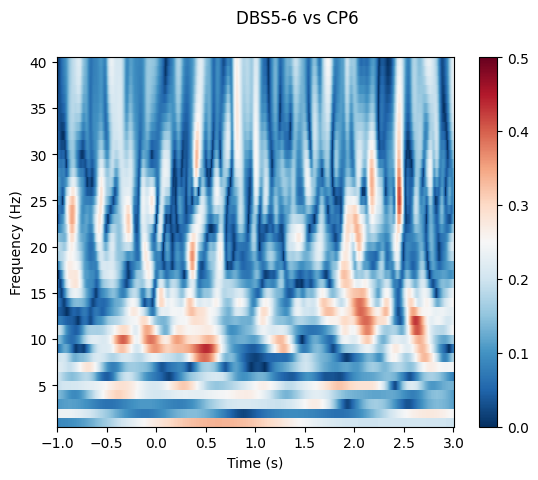

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


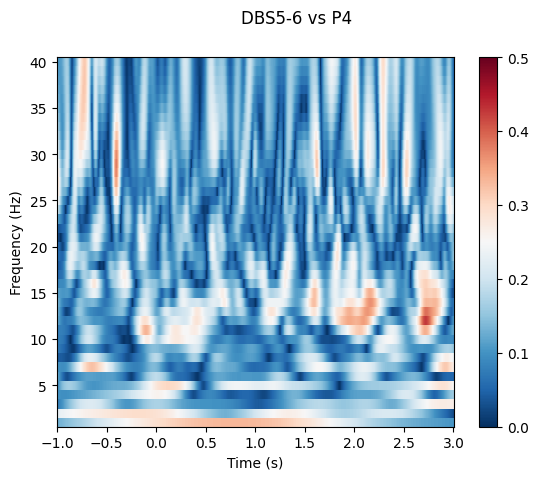

Reading /mnt/beegfs/malann/Oddball Data/EDEN015/ANALYSIS/tfr_oddimplantDBS6-7-tfr.h5 ...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


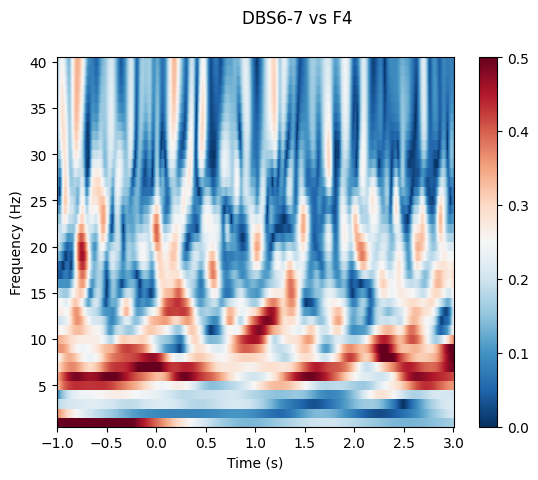

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


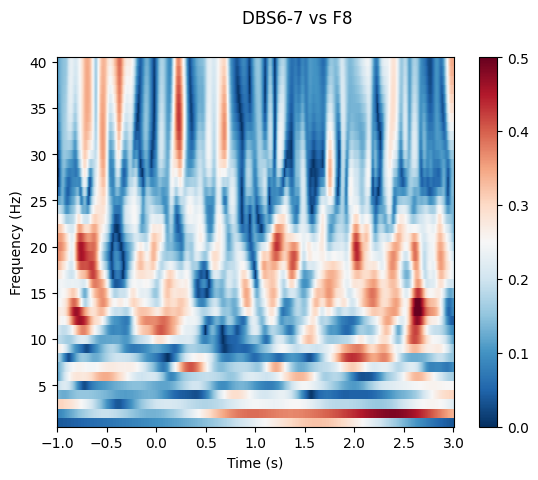

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


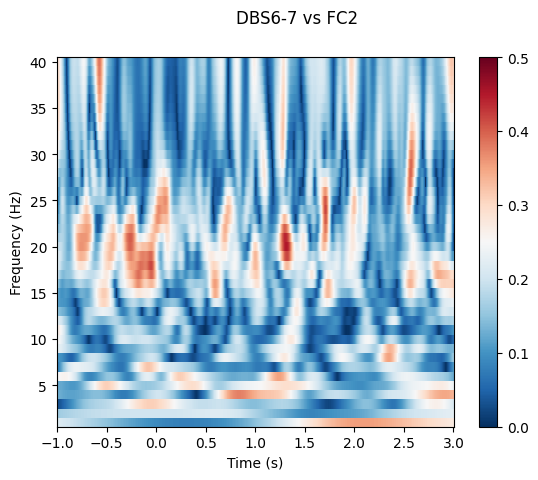

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


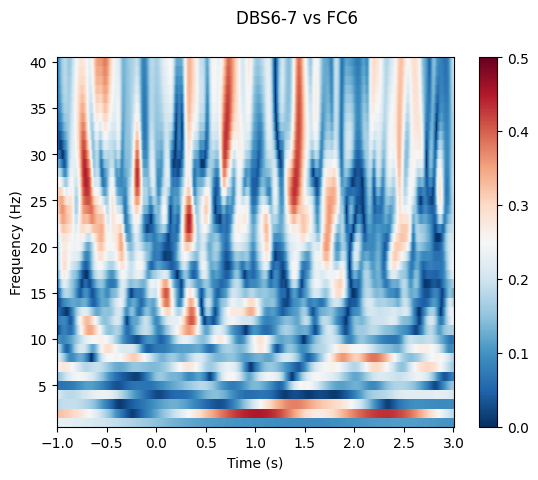

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


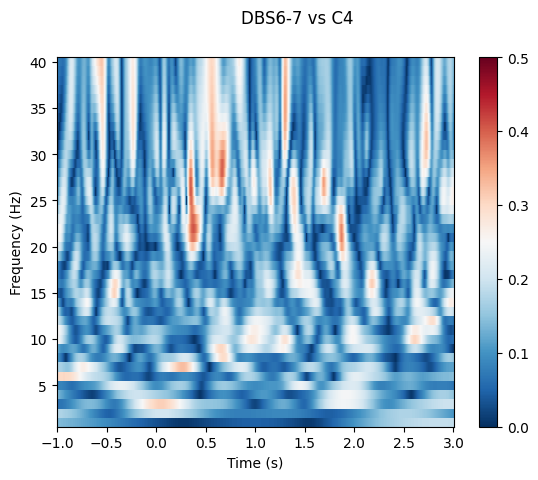

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


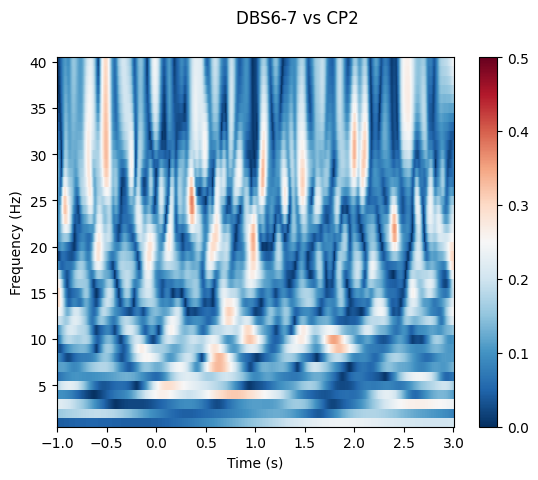

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


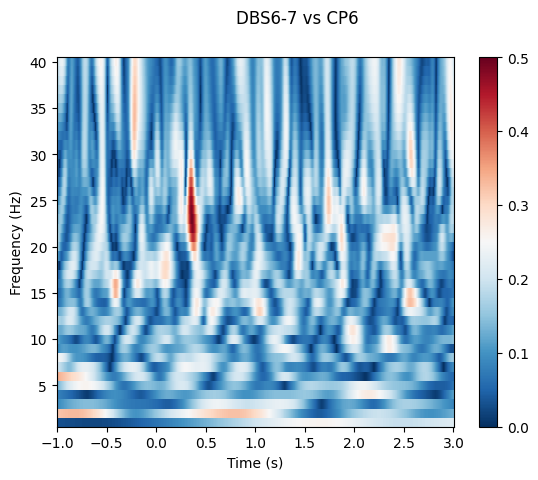

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


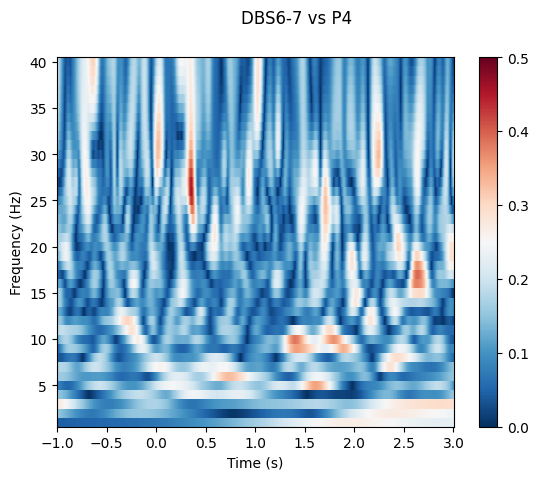

Reading /mnt/beegfs/malann/Oddball Data/EDEN015/ANALYSIS/tfr_oddimplantDBS7-8-tfr.h5 ...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


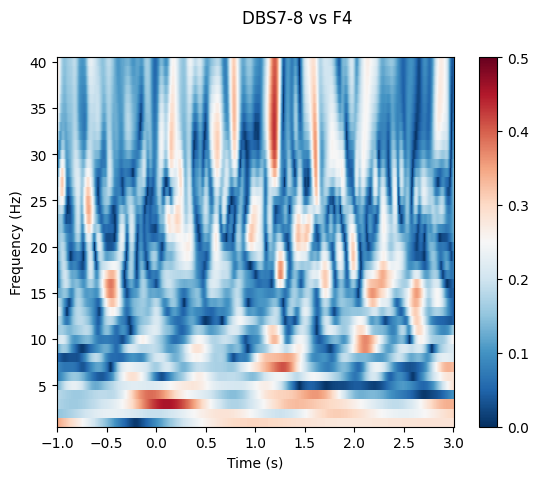

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


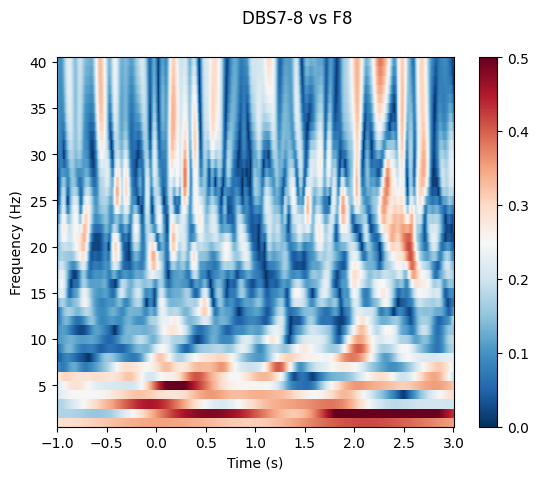

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


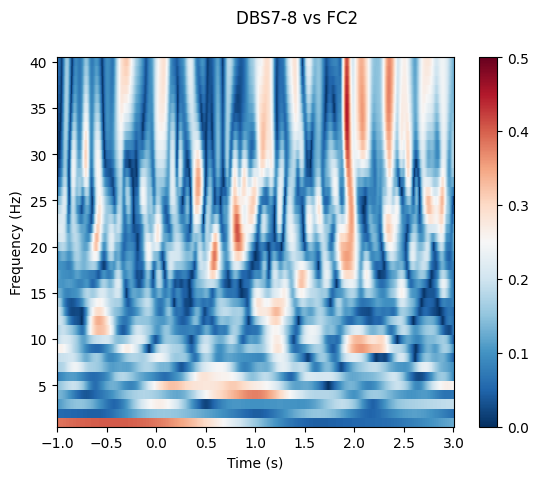

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


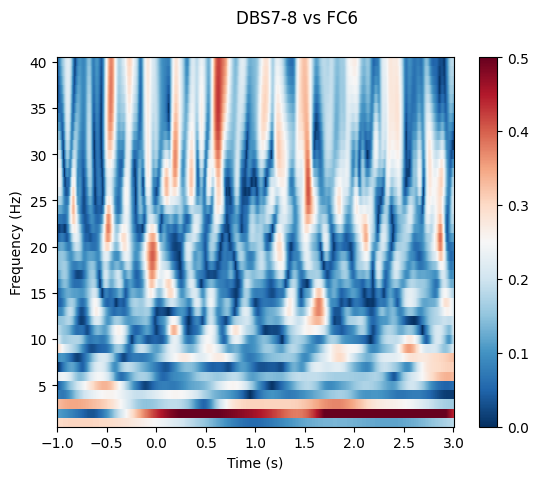

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


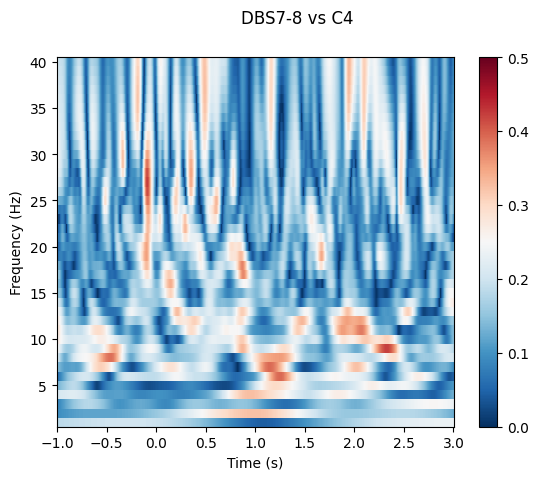

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


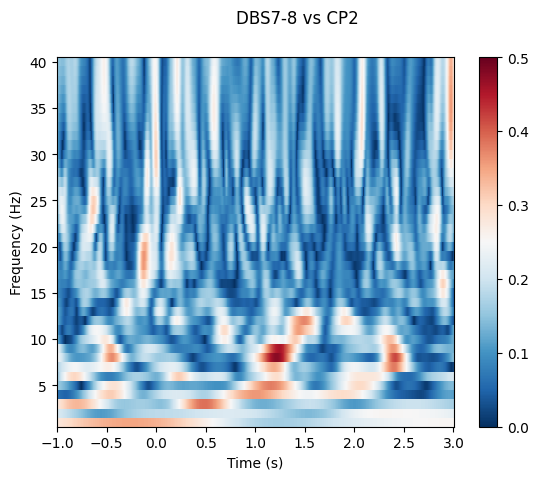

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


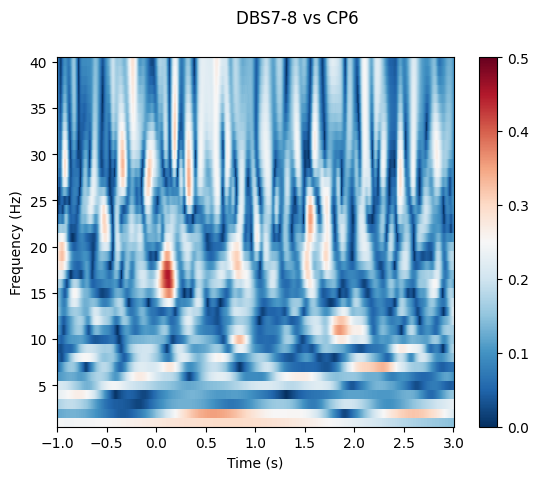

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


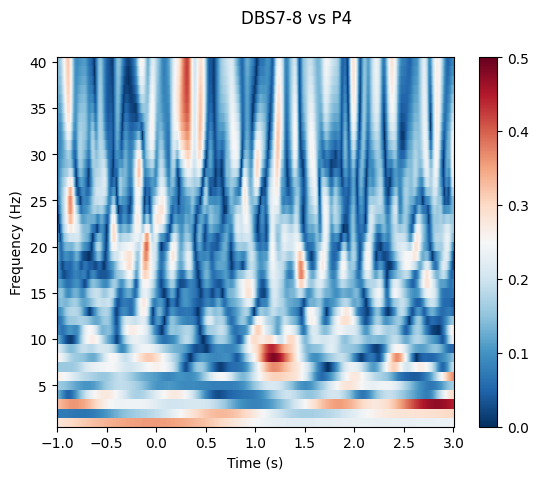

In [174]:
for seed_ch in seed_chs:
    tfr = mne.time_frequency.read_tfrs(result_dir+'tfr_odd'+st+seed_ch+'-tfr.h5')
    tfr = tfr[0]
    for ch in tfr.copy().pick(ch_picks).ch_names:
        title = seed_ch+' vs '+ch 
        tfr.plot(ch, tmin=-1,tmax=3, title=title,vmax=0.5,vmin=0)


Reading /mnt/beegfs/malann/Oddball Data/EDEN015/ANALYSIS/tfr_oddimplantDBS1-2-tfr.h5 ...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


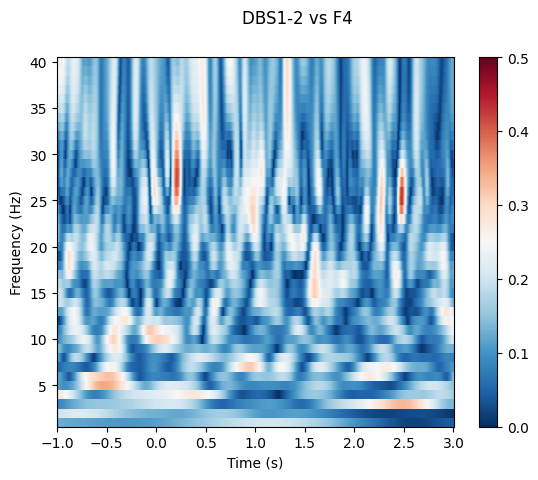

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


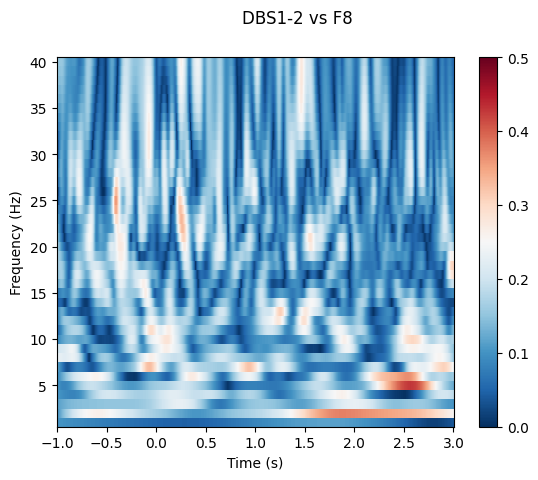

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


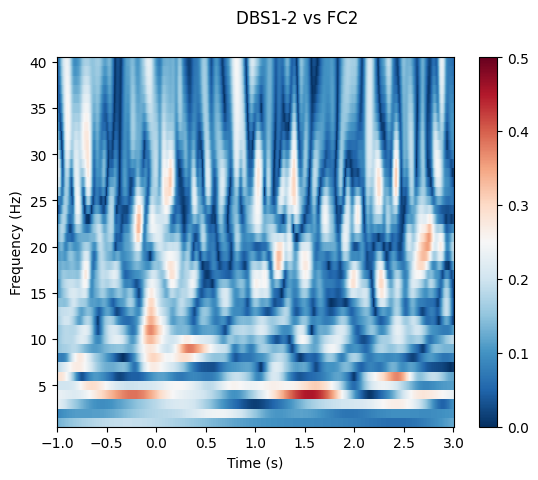

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


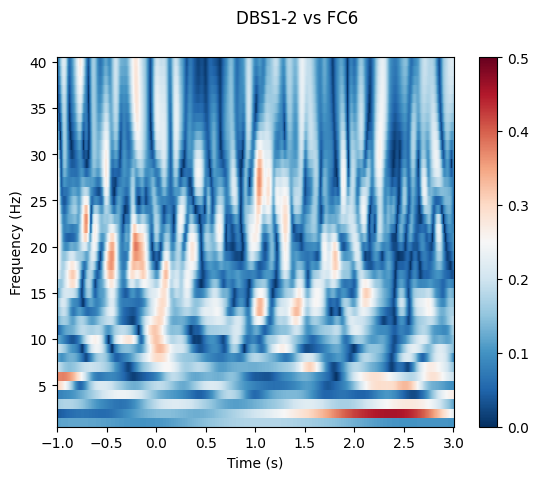

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


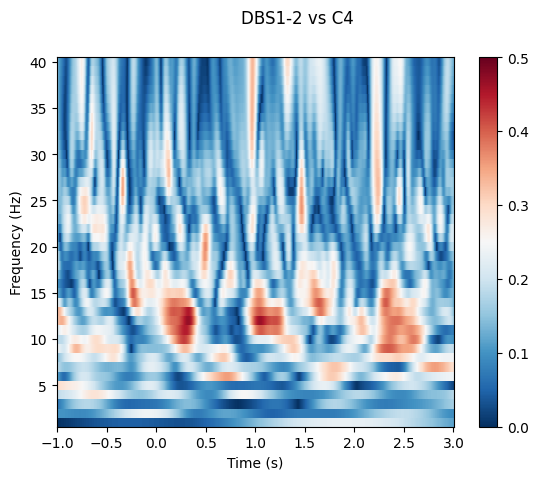

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


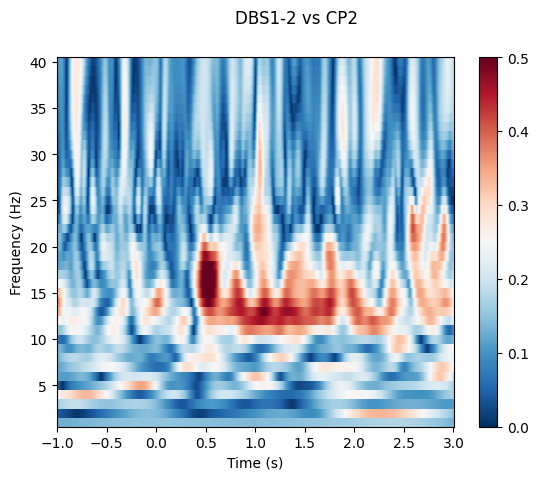

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


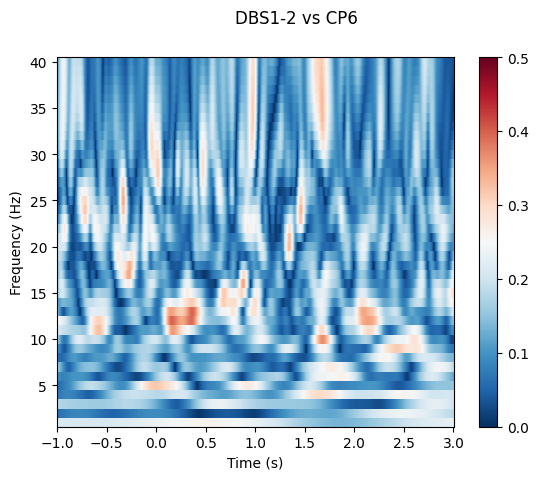

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


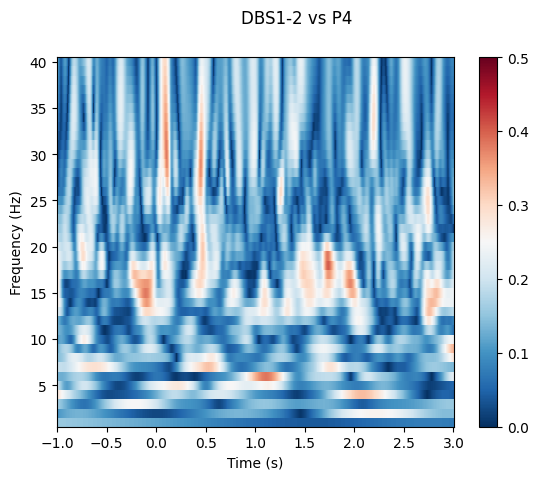

Reading /mnt/beegfs/malann/Oddball Data/EDEN015/ANALYSIS/tfr_oddimplantDBS2-3-tfr.h5 ...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


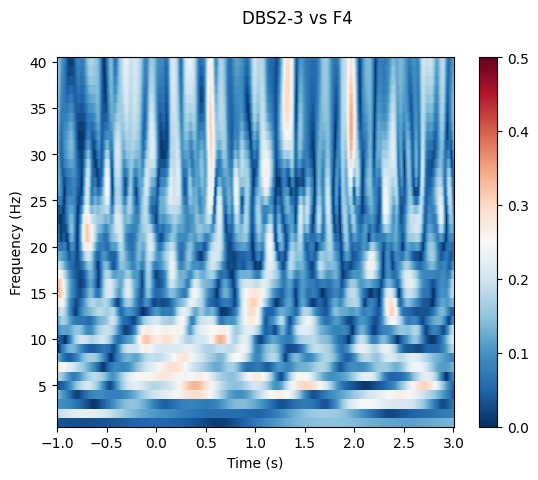

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


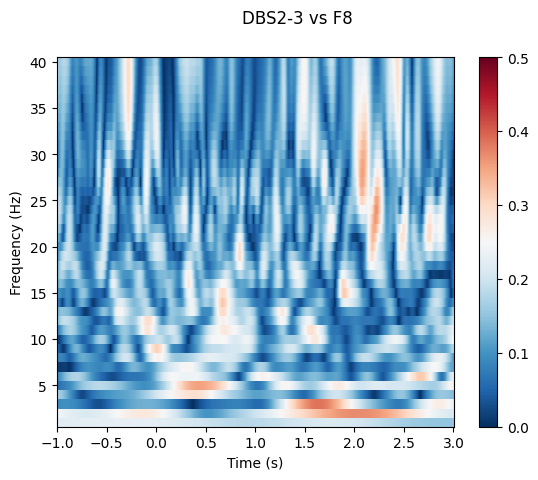

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


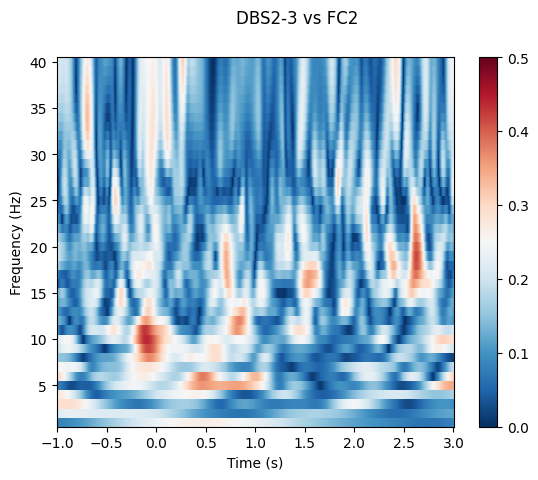

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


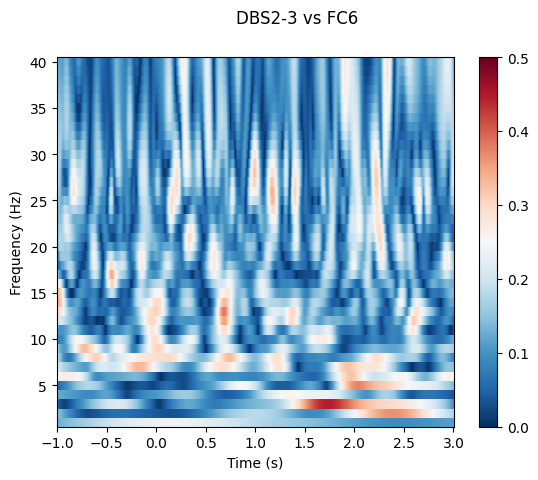

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


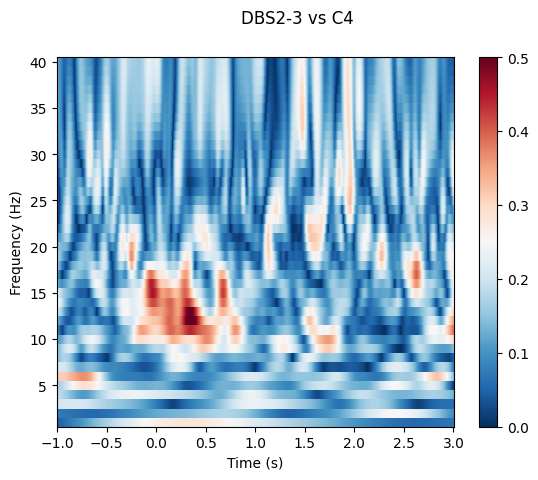

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


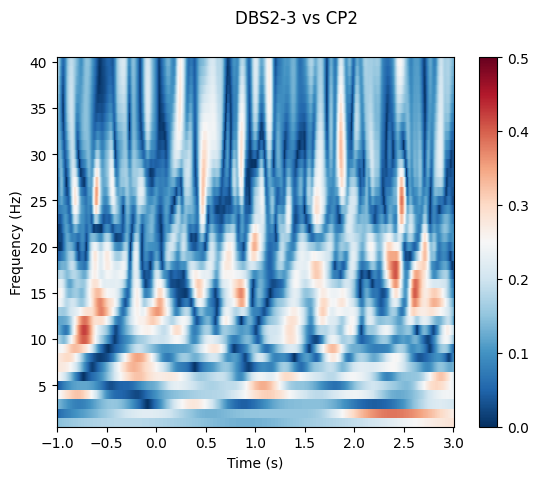

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


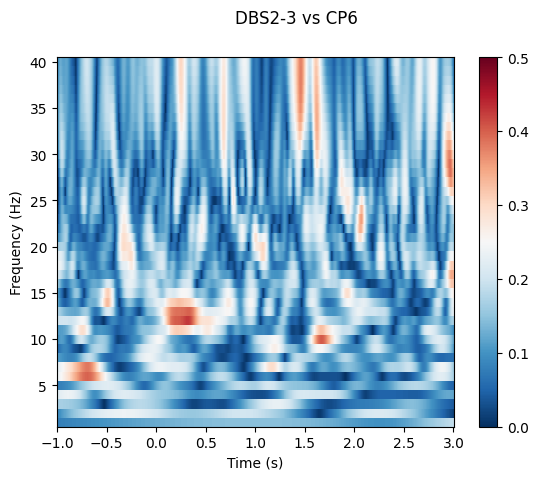

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


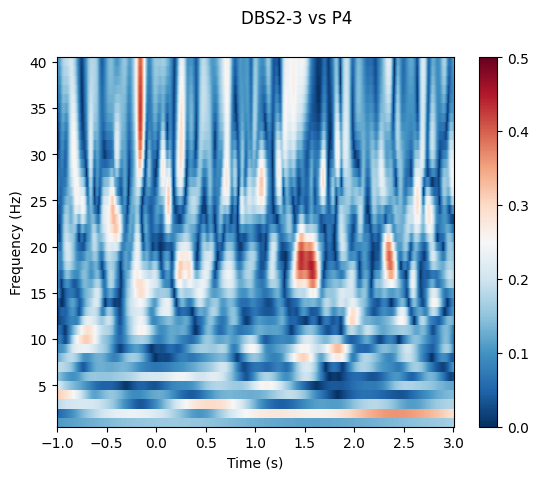

Reading /mnt/beegfs/malann/Oddball Data/EDEN015/ANALYSIS/tfr_oddimplantDBS3-4-tfr.h5 ...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


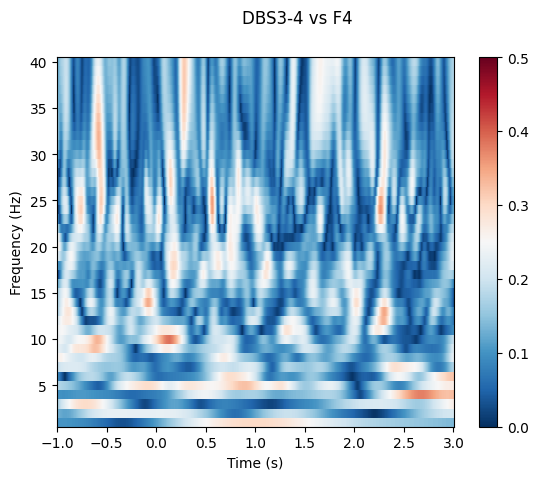

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


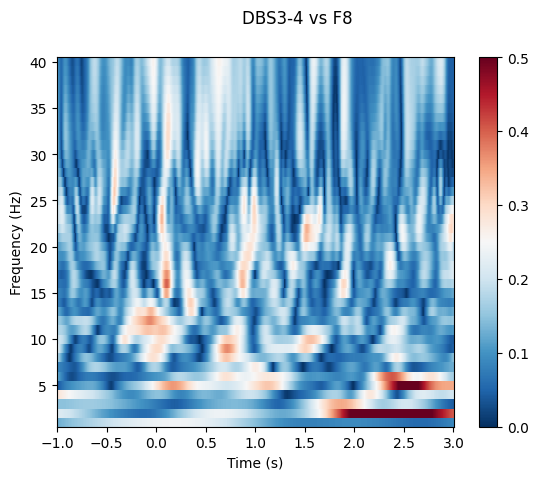

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


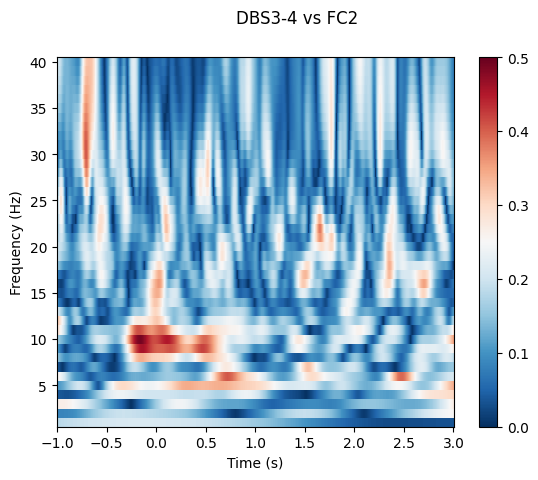

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


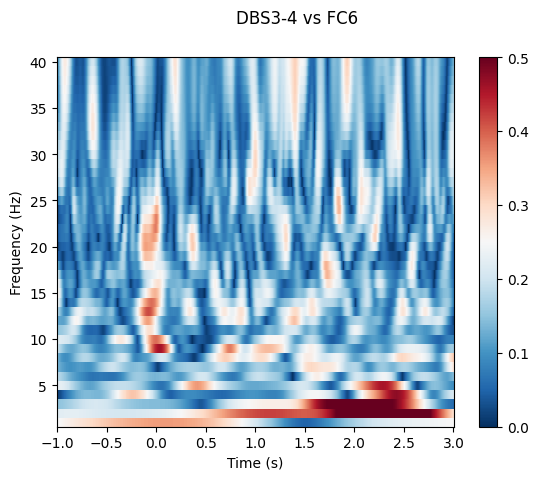

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


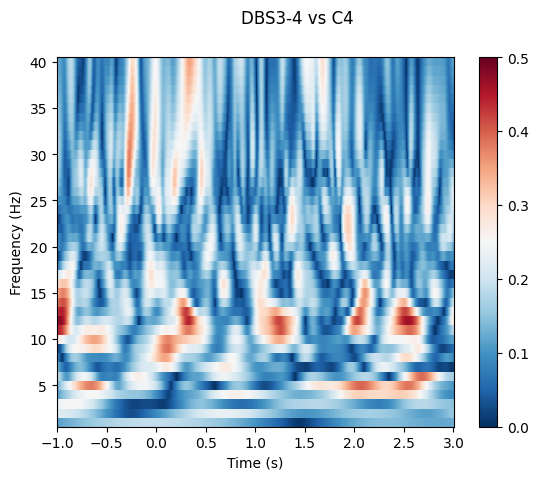

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


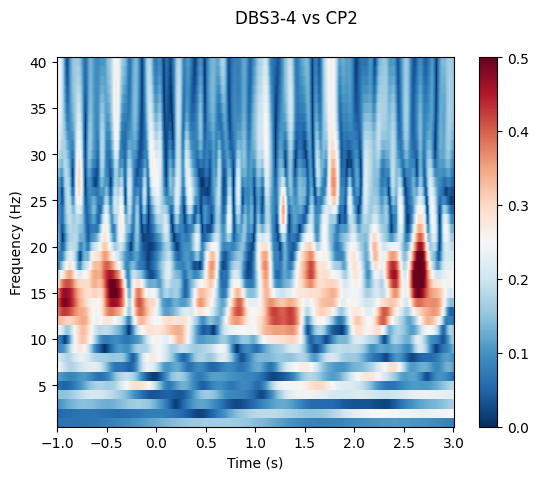

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


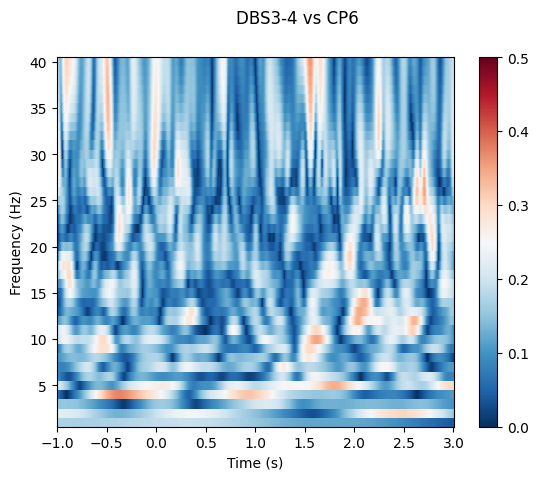

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


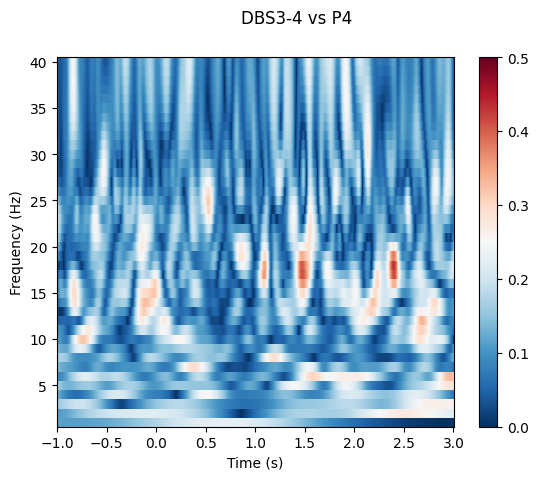

Reading /mnt/beegfs/malann/Oddball Data/EDEN015/ANALYSIS/tfr_oddimplantDBS4-5-tfr.h5 ...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


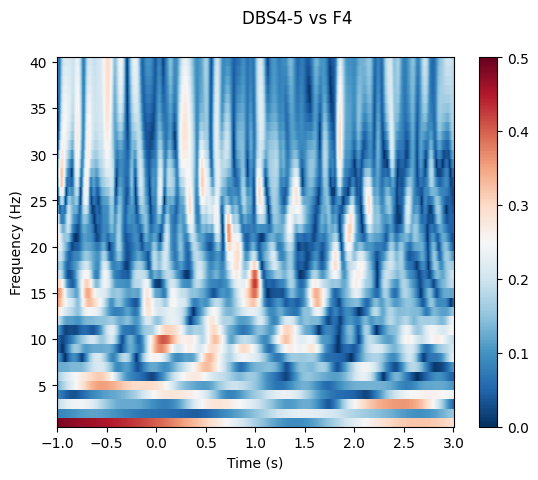

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


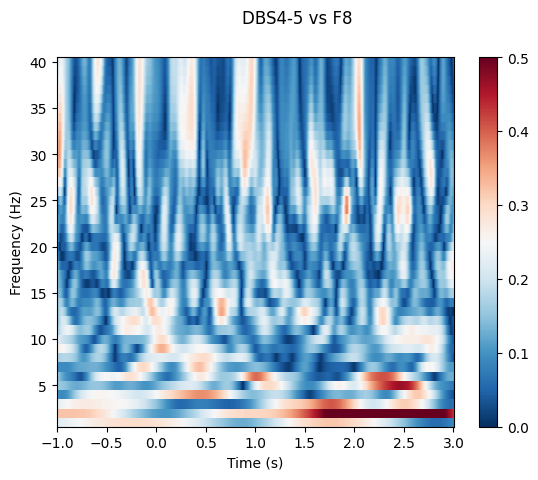

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


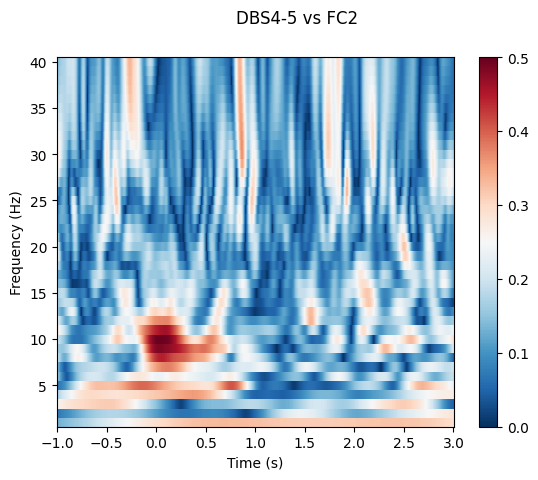

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


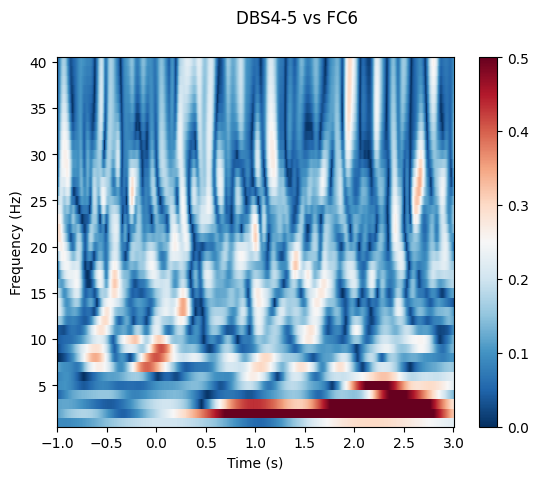

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


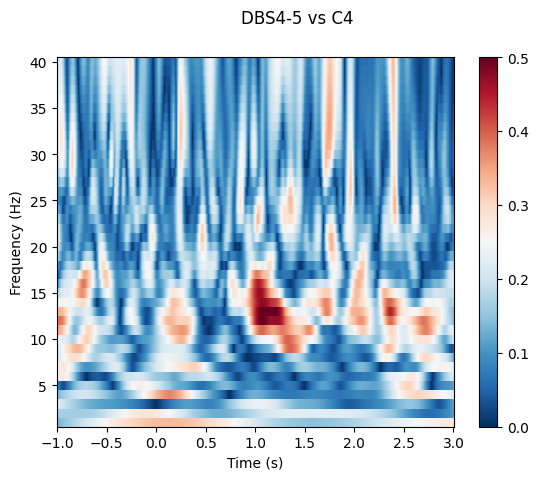

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


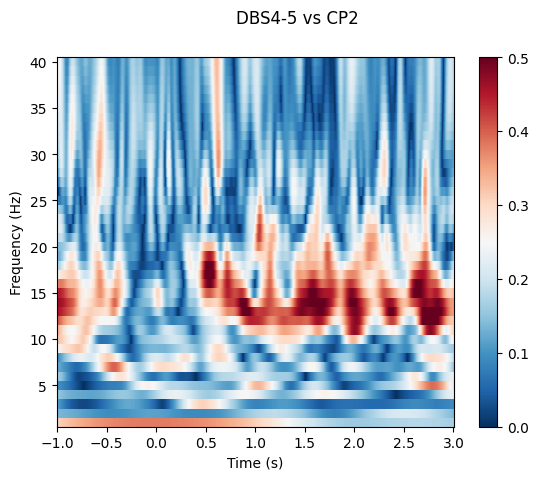

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


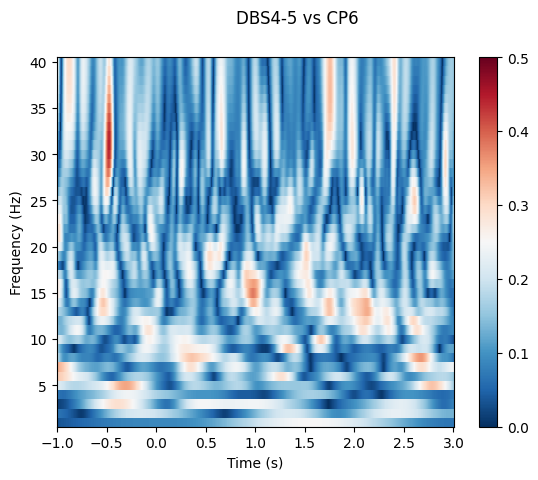

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


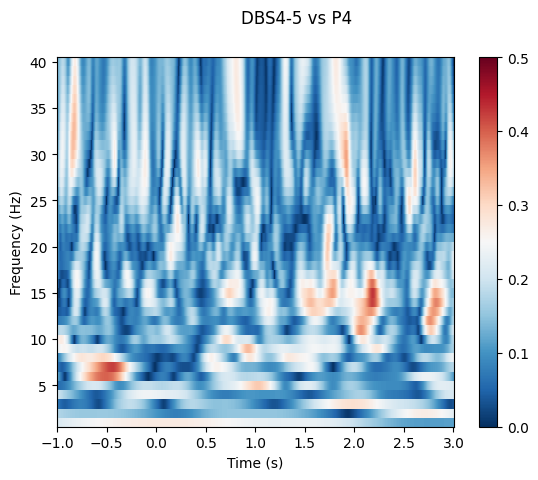

Reading /mnt/beegfs/malann/Oddball Data/EDEN015/ANALYSIS/tfr_oddimplantDBS5-6-tfr.h5 ...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


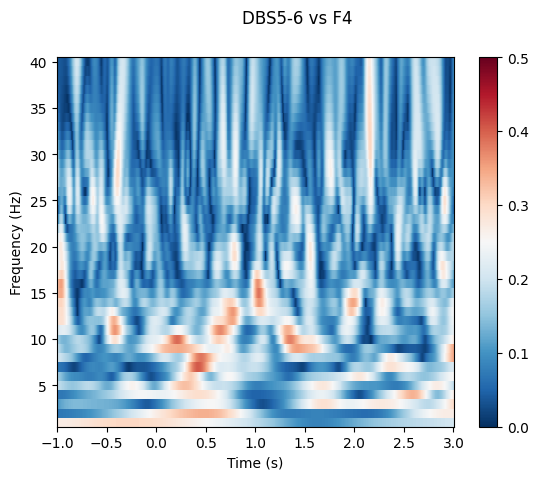

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


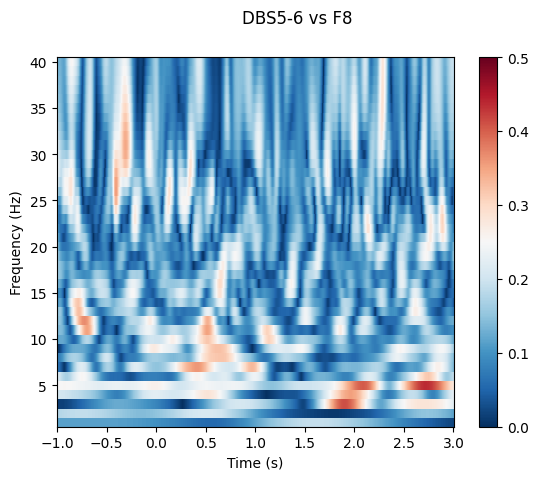

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


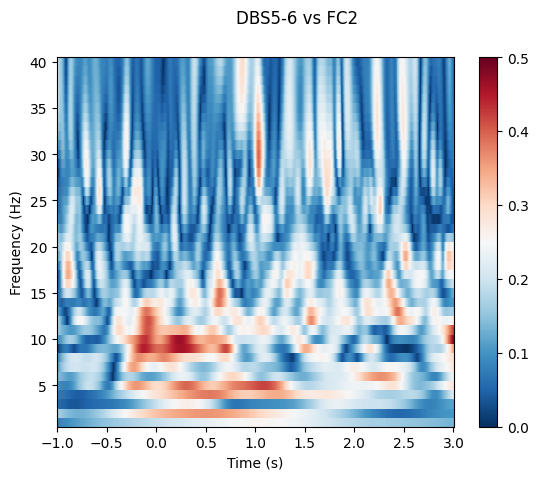

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


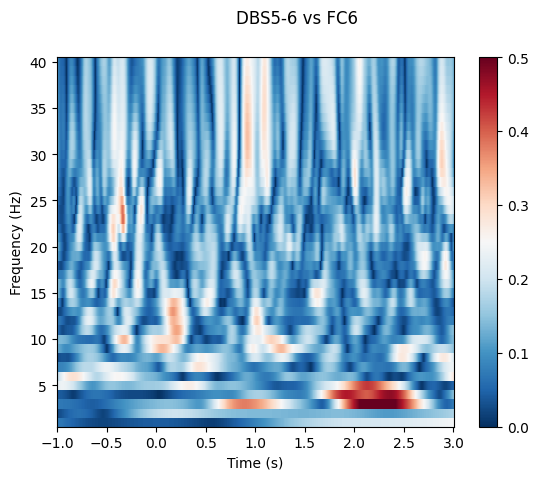

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


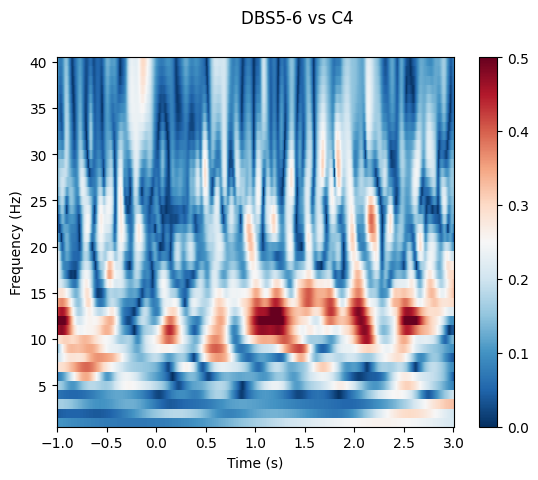

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


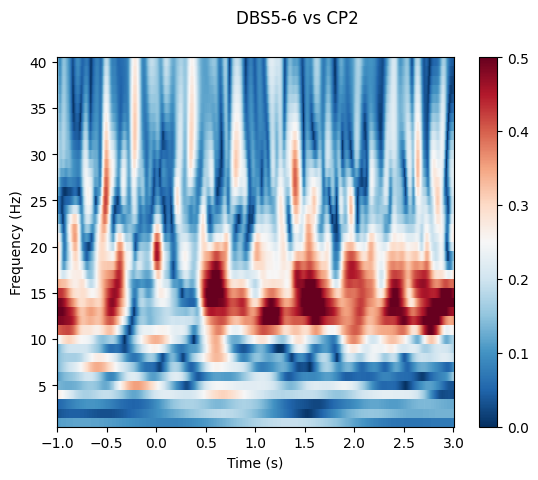

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


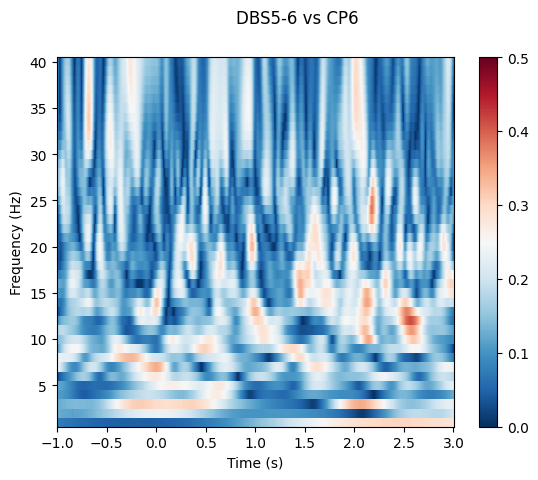

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


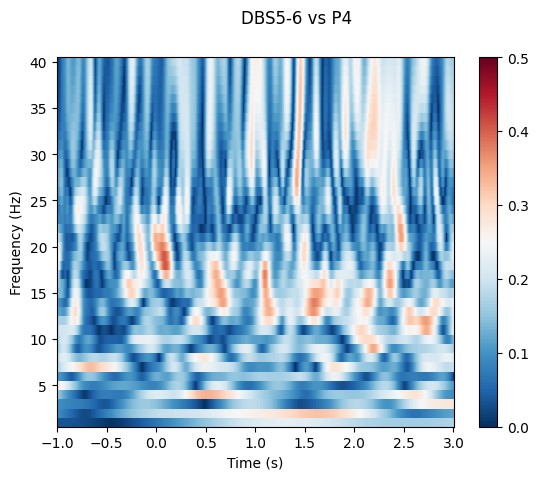

Reading /mnt/beegfs/malann/Oddball Data/EDEN015/ANALYSIS/tfr_oddimplantDBS6-7-tfr.h5 ...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


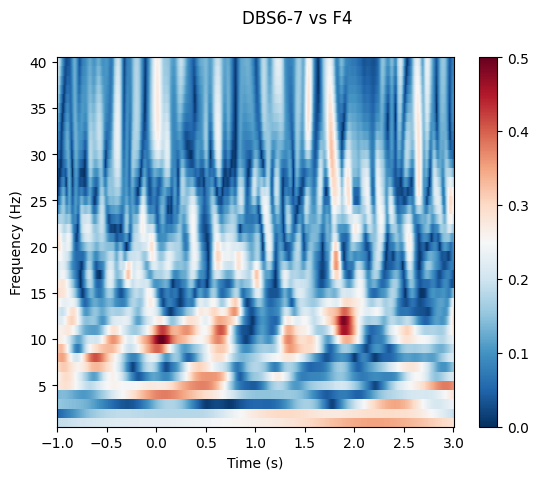

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


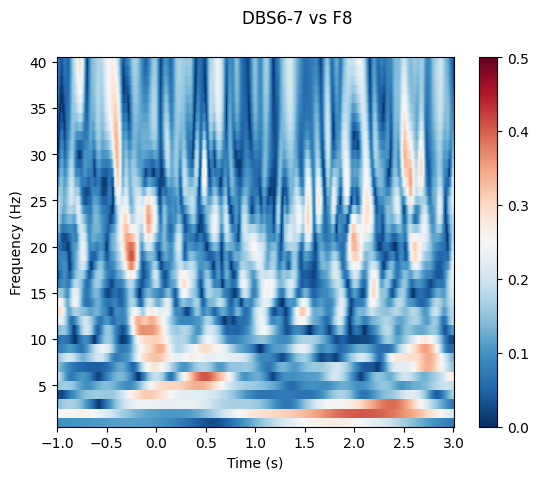

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


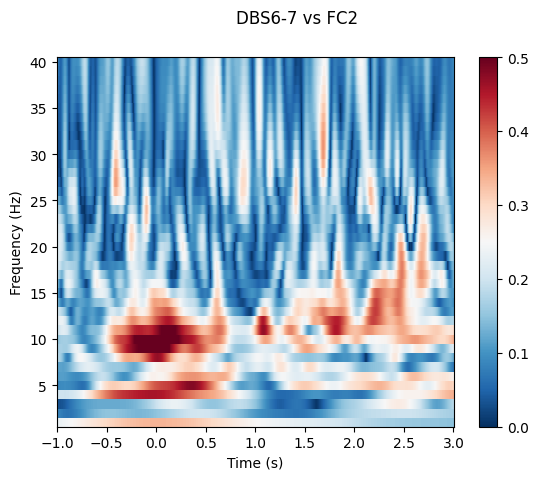

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


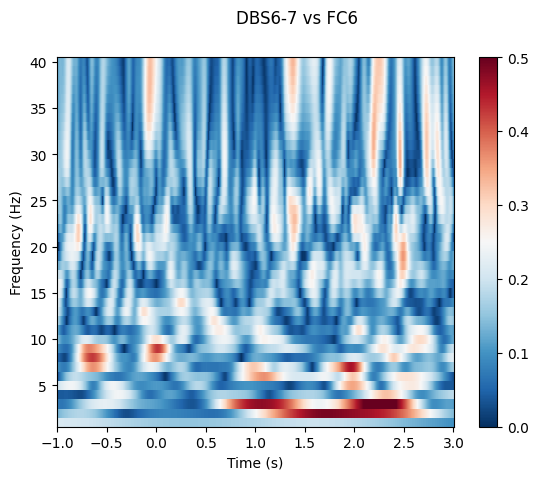

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


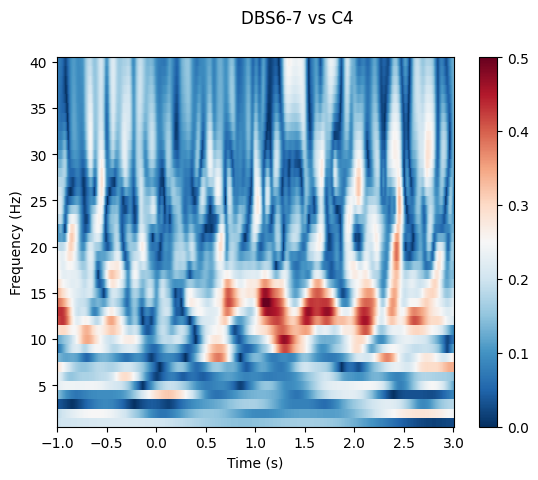

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


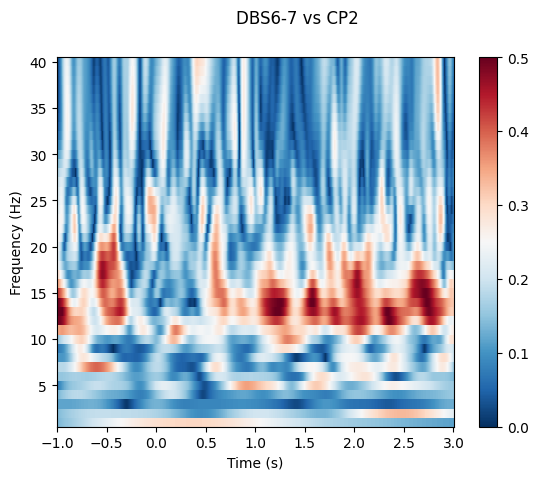

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


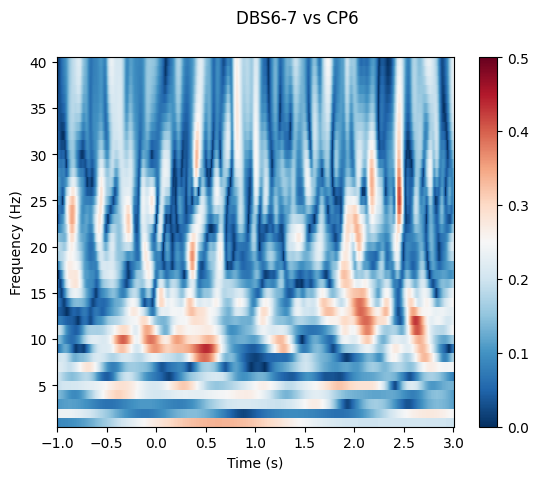

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


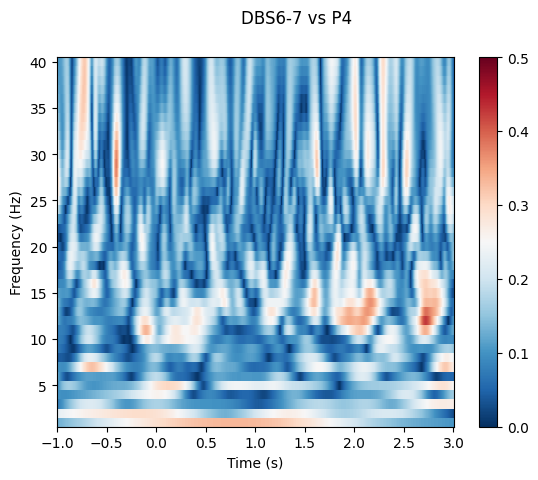

Reading /mnt/beegfs/malann/Oddball Data/EDEN015/ANALYSIS/tfr_oddimplantDBS7-8-tfr.h5 ...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


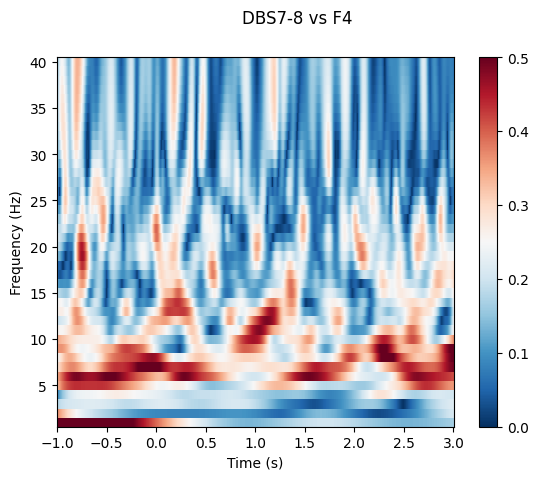

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


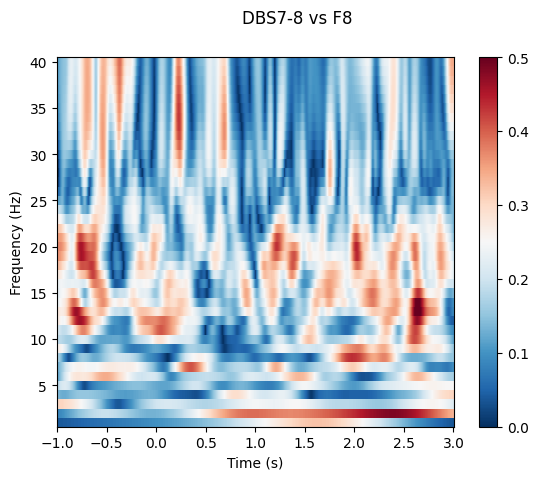

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


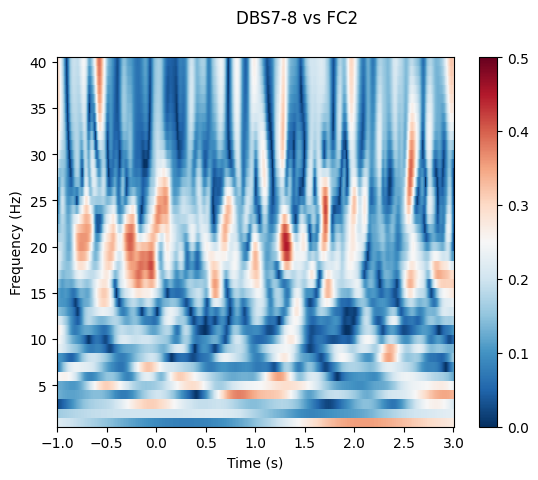

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


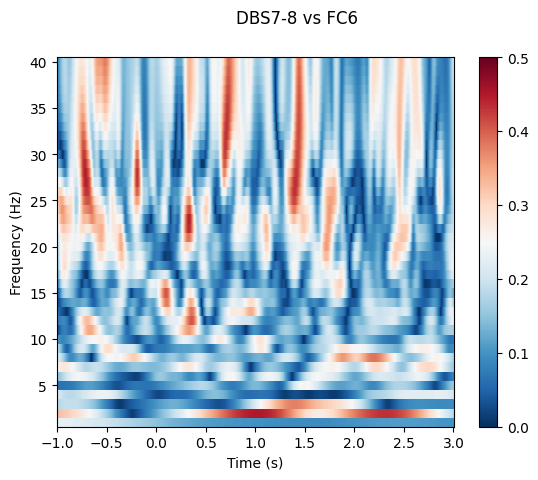

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


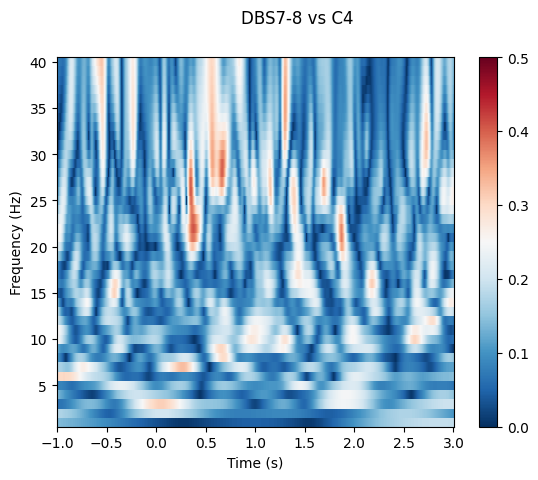

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


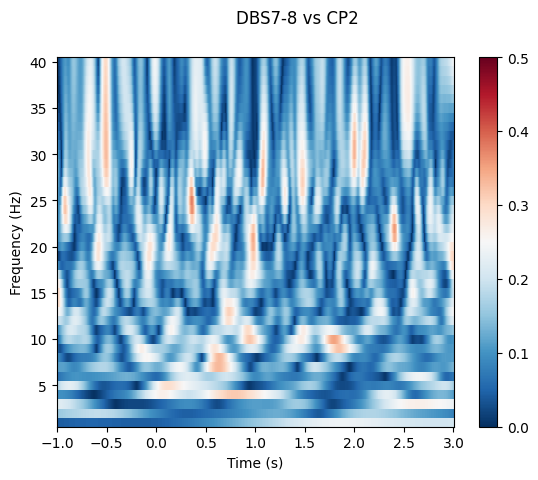

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


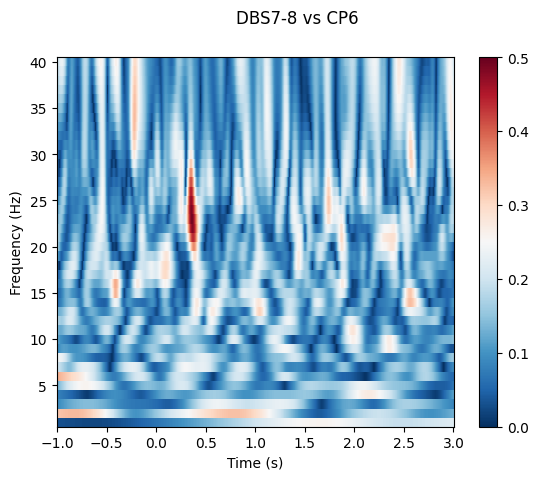

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


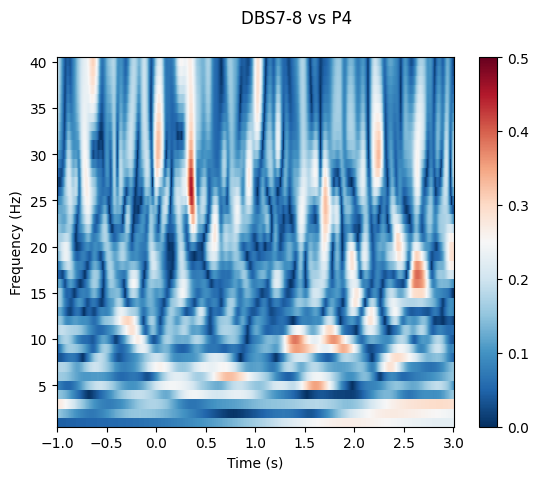

In [161]:
for seed_ch in seed_chs:
    tfr = mne.time_frequency.read_tfrs(result_dir+'tfr_odd'+st+seed_ch+'-tfr.h5')
    tfr = tfr[0]
    for ch in tfr.copy().pick(ch_picks).ch_names:
        title = seed_ch+' vs '+ch 
        tfr.plot(ch, tmin=-1,tmax=3, title=title,vmax=0.5,vmin=0)


In [157]:
ax

<Axes: >

No baseline correction applied


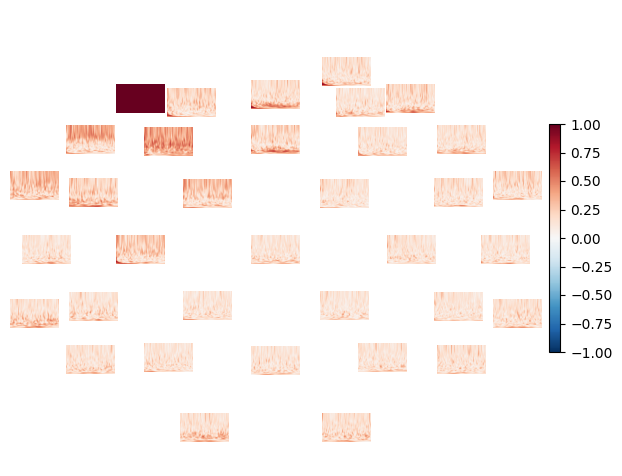

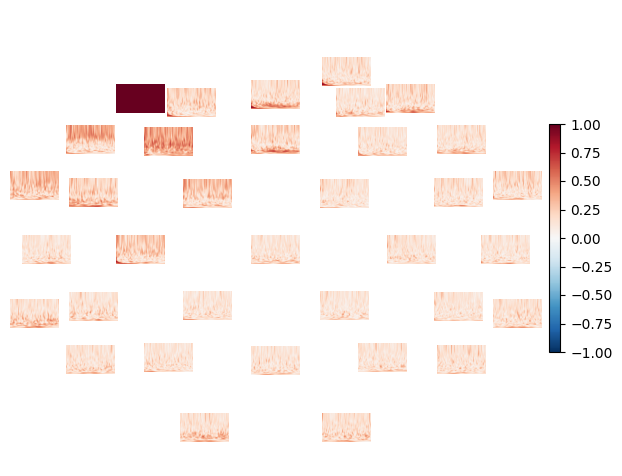

In [172]:
tfr.plot_topo(fig_facecolor="w", font_color="k", border="k")